In [ ]:
#  importing necessary libraries
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#  Loadinng the dadatset
df = pd.read_csv('/content/Walmart.csv', date_parser = 'Date')
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667


In [ ]:
# converting the dtype of Date column into DateTime dtype
df['Date'] = pd.to_datetime(df['Date'], dayfirst = True)
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667


In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 402.3 KB


# There are eight features available in the dataset:

number of numeric features     : 6

number of datetime features    : 1

number of categorical features : 1

# Data Preprocessing and Exploratory Data Analysis

In [ ]:
#  checking about missing values in the dataset
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

There is no missing value available in the entire dataset.

---



---



In [ ]:
df.duplicated().sum()

0

There is no duplicate record available in the given dataset.

---



In [ ]:
# Statistical Description About The dataset
df.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [ ]:
#  Histogran of numerical features in a dataset
col_list = df.select_dtypes(include = ['int', 'float']).columns.tolist()
col_list.remove('Holiday_Flag')


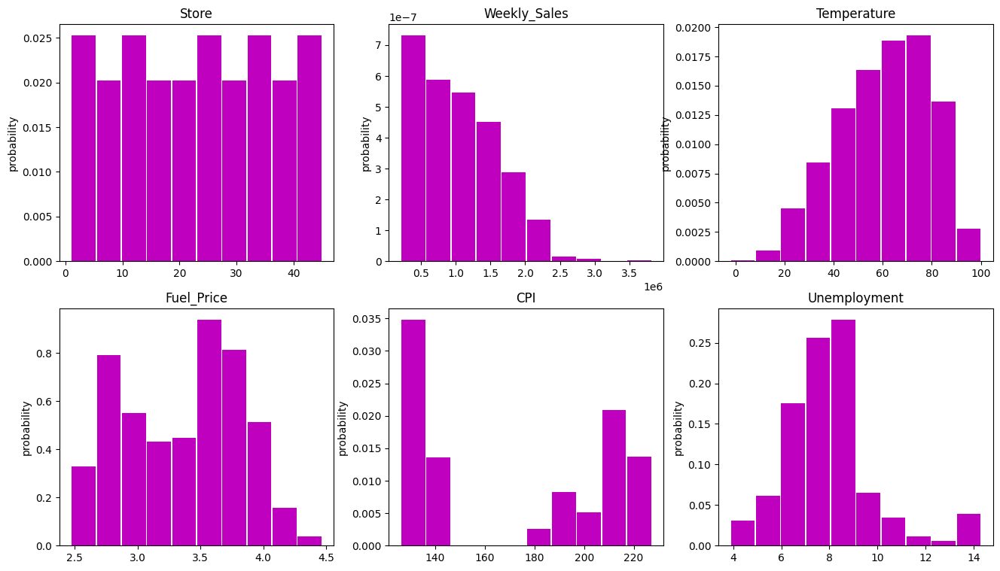

In [ ]:
plt.figure(figsize = (16,9))
for i, col in enumerate(col_list):
    plt.subplot(2,3,i+1)
    plt.title(col)
    plt.ylabel('probability')
    plt.hist(df[col],rwidth = 0.95,density = True, color = 'm')

<Axes: title={'center': 'HoliDay_Flag'}, ylabel='counts'>

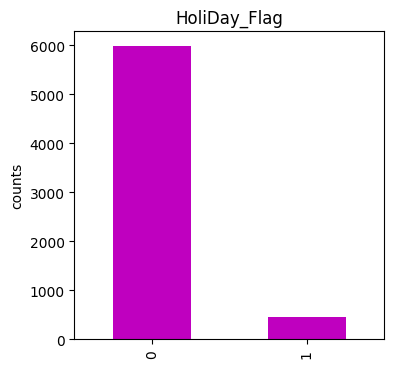

In [ ]:
#  Categorical Feature Holiday_Flag
plt.figure(figsize = (4,4))
plt.title('HoliDay_Flag')
plt.ylabel('counts')
df['Holiday_Flag'].value_counts().plot(kind = 'bar', color = 'm')


<Axes: title={'center': 'Bar Plot for Average of Weekly Sales per Store'}, xlabel='Store', ylabel='Average of weekly sales '>

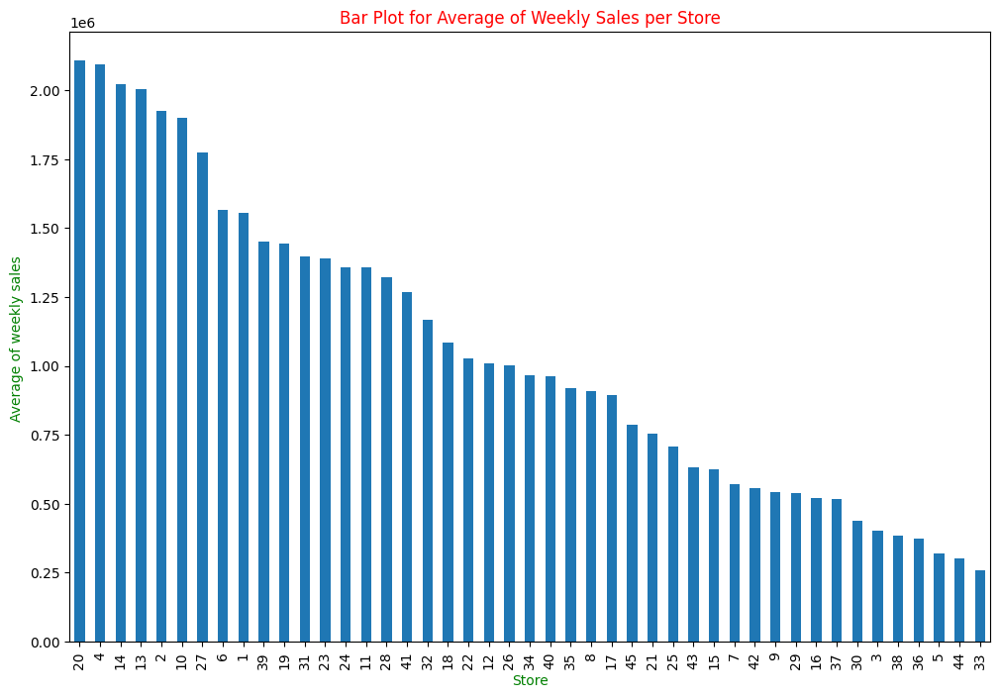

In [ ]:
plt.figure(figsize = (12,8))
plt.title('Bar Plot for Average of Weekly Sales per Store', color = 'red')
plt.ylabel('Average of weekly sales ', color = 'green')
plt.xlabel('Store Number', color = 'green')
df.groupby(['Store'])['Weekly_Sales'].mean().sort_values(ascending = False).plot(kind = 'bar')

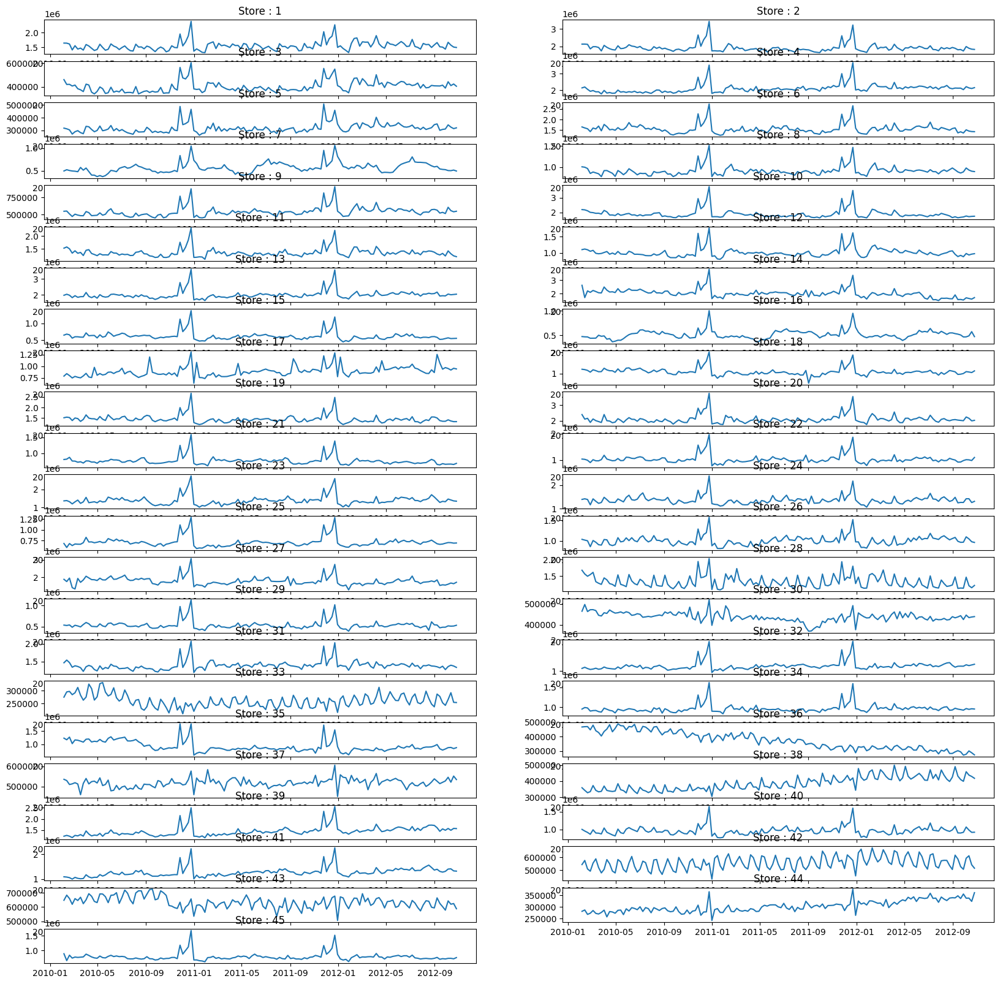

In [ ]:
plt.figure(figsize = (20,20))
for i in range(1, len(df['Store'].unique())+1):
  plt.subplot(23,2, i)
  plt.title(f"Store : {i}")
  ts_df = df[df['Store'] == i][["Date", "Weekly_Sales"]]
  plt.plot(ts_df['Date'], ts_df['Weekly_Sales'])

# **Data Visualization and Distribution of the numerical features**

In [ ]:
numerical_features = df.select_dtypes(include=['float']).columns.tolist()
numerical_features

['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']

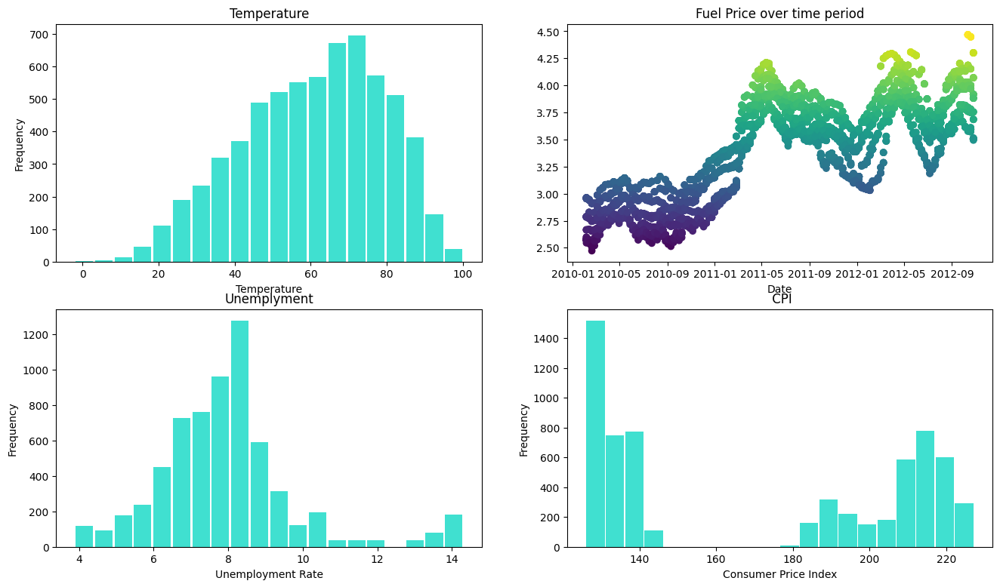

In [ ]:
plt.figure(figsize = (16,9))
plt.grid()
plt.subplot(2,2,1)
plt.title('Temperature')
plt.xlabel('Temperature')
plt.ylabel('Frequency')
plt.hist(df['Temperature'],density = False ,bins = 20,rwidth = 0.9 , color = 'turquoise',)

plt.subplot(2,2,2)
plt.title('Fuel Price over time period')
plt.xlabel('Date')
plt.scatter(df['Date'], df['Fuel_Price'],c = df['Fuel_Price'] ,cmap= 'viridis')

plt.subplot(2,2,3)
plt.title('Unemplyment')
plt.ylabel('Frequency')
plt.xlabel('Unemployment Rate')
plt.hist(df['Unemployment'],density = False, bins = 20, rwidth = 0.9, color = 'turquoise')


plt.subplot(2,2,4)
plt.title(' CPI')
plt.ylabel('Frequency')
plt.xlabel('Consumer Price Index')
plt.hist(df['CPI'], density = False, bins = 20,rwidth = 0.95, color = 'turquoise' )
plt.show()



In [ ]:
#  Adding month and Year in the DataFrame for further Analysis
df['Year']= df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Week'] = df['Date'].dt.week

In [ ]:
# Identifying monthly sales for each year
monthly_sales_df = pd.DataFrame(df.groupby(['Year', 'Month'])['Weekly_Sales'].mean())
monthly_sales_df = monthly_sales_df.reset_index()
monthly_sales_df = monthly_sales_df.set_index(['Year'])
month_pivot_df = pd.DataFrame(monthly_sales_df.pivot(columns = ['Month']))
month_pivot_df

Weekly_Sales                                                          \
Month             1             2             3             4             5    
Year                                                                           
2010             NaN  1.057405e+06  1.010666e+06  1.028499e+06  1.037283e+06   
2011   909466.482389  1.035174e+06  9.964247e+05  1.006784e+06  1.009156e+06   
2012   938302.620333  1.067020e+06  1.028932e+06  1.049561e+06  1.048703e+06   

                                                                             \
Month            6             7             8             9             10   
Year                                                                          
2010   1.068034e+06  1.033689e+06  1.042445e+06  9.848216e+05  9.651637e+05   
2011   1.054297e+06  1.021828e+06  1.047774e+06  9.815455e+05  1.018118e+06   
2012   1.069379e+06  1.041719e+06  1.052670e+06  1.003586e+06  1.024232e+06   

                                   
Month            11            12  
Year                               
2010   1.126963e+06  1.283380e+06  
2011   1.167569e+06  1.280347e+06  
2012            NaN           NaN

<Figure size 3000x2000 with 0 Axes>

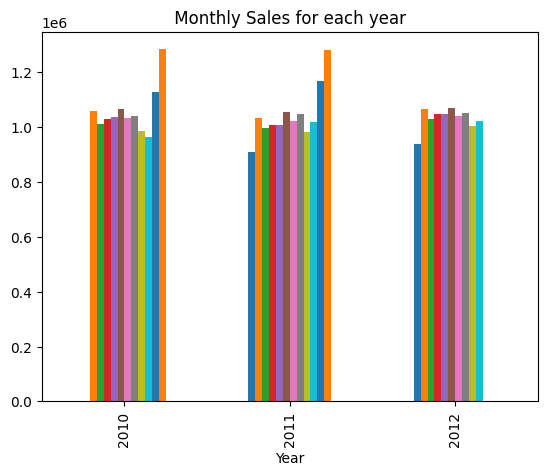

In [ ]:

plt.figure(figsize = (30, 20,))
month_pivot_df.plot(kind = 'bar', legend = False)
plt.title(' Monthly Sales for each year ', color = 'black')
plt.show()

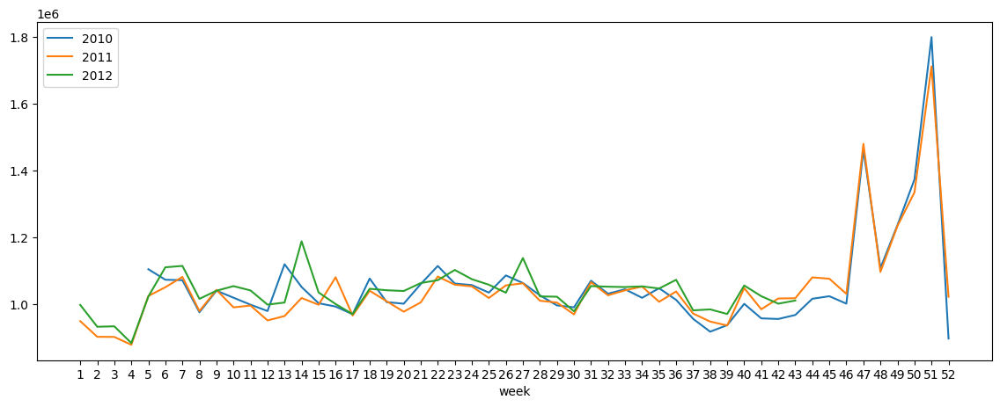

In [ ]:
# Identifying week over week sales for each year
plt.figure(figsize = (14, 5))
for i in range(2010,2013,1):
  df_week = df[df['Year'] ==i]
  df_week['week'] = df_week['Date'].dt.week
  df_week.groupby(['week'])['Weekly_Sales'].mean().plot(label = f'{i}')
plt.xticks([i for i in range(1,53)])
plt.legend()
plt.show()



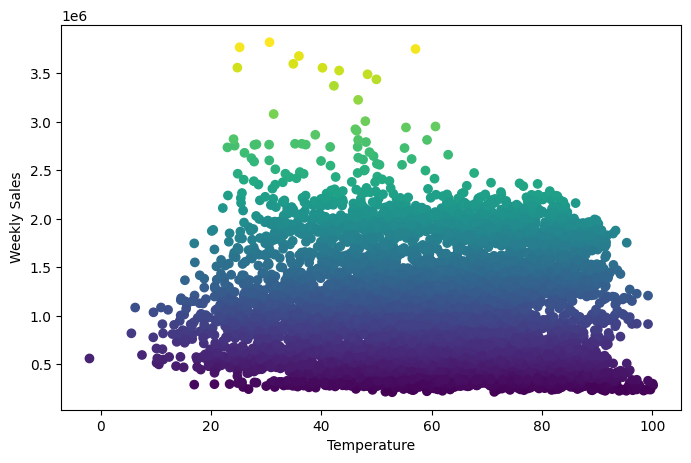

In [ ]:
plt.figure(figsize = (8,5))
plt.scatter( df['Temperature'], df['Weekly_Sales'],c = df['Weekly_Sales'] )
plt.xlabel('Temperature')
plt.ylabel('Weekly Sales')
plt.show()

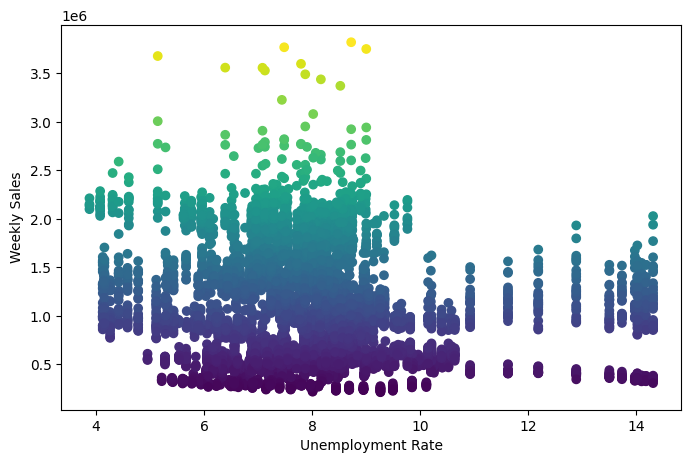

In [ ]:
#  impact of unemployment on sales
plt.figure(figsize = (8,5))
plt.scatter(df['Unemployment'], df['Weekly_Sales'], c = df['Weekly_Sales'])
plt.xlabel('Unemployment Rate')
plt.ylabel('Weekly Sales')
plt.show()

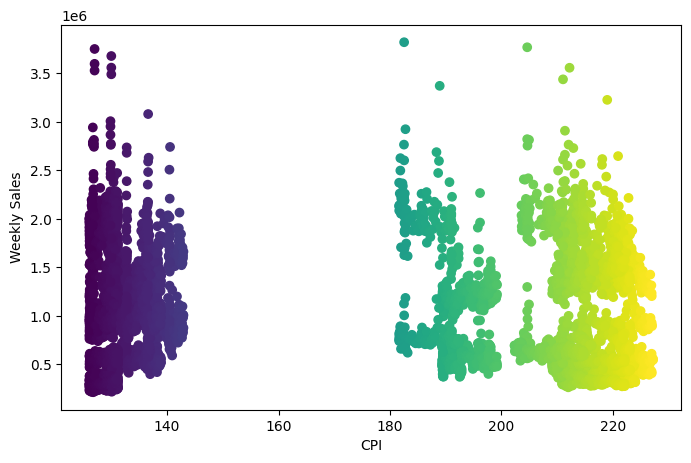

In [ ]:
# Impact of CPI on Weekly Sales
plt.figure(figsize = (8,5))
plt.scatter(df['CPI'], df['Weekly_Sales'], c = df['CPI'])
plt.xlabel('CPI')
plt.ylabel('Weekly Sales')
plt.show()

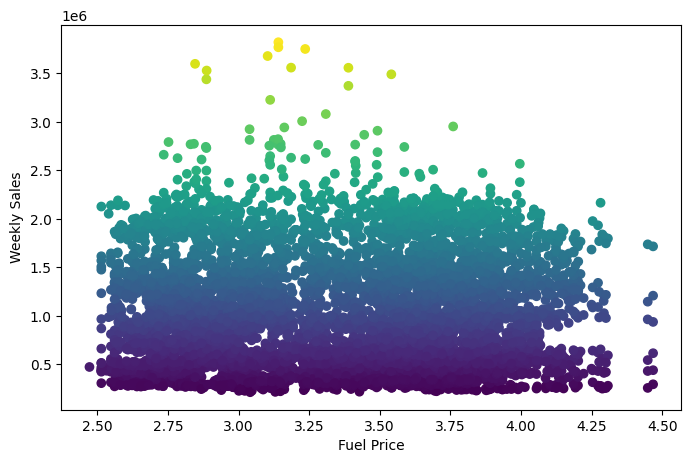

In [ ]:
# Impact of Fuel Price on Sales
plt.figure(figsize = (8,5))
plt.scatter(df['Fuel_Price'], df['Weekly_Sales'], c = df['Weekly_Sales'])
plt.xlabel('Fuel Price')
plt.ylabel('Weekly Sales')
plt.show()

In [ ]:
# Holiday vs Non- Holiday Average weekly Sales
Holiday_df = df.groupby(['Year','Holiday_Flag']).agg({'Weekly_Sales' : 'mean'})
Holiday_df = Holiday_df.reset_index()
Holiday_df

,Year,Holiday_Flag,Weekly_Sales
0,2010,0,1.054880e+06
1,2010,1,1.112359e+06
2,2011,0,1.037715e+06
3,2011,1,1.148530e+06
4,2012,0,1.030782e+06
5,2012,1,1.092661e+06


In [ ]:
Holiday_pivot =Holiday_df.pivot(index = 'Year', columns = 'Holiday_Flag', values = 'Weekly_Sales')
Holiday_pivot

Holiday_Flag,0,1
Year,,
2010,1.054880e+06,1.112359e+06
2011,1.037715e+06,1.148530e+06
2012,1.030782e+06,1.092661e+06


<Figure size 2500x2500 with 0 Axes>

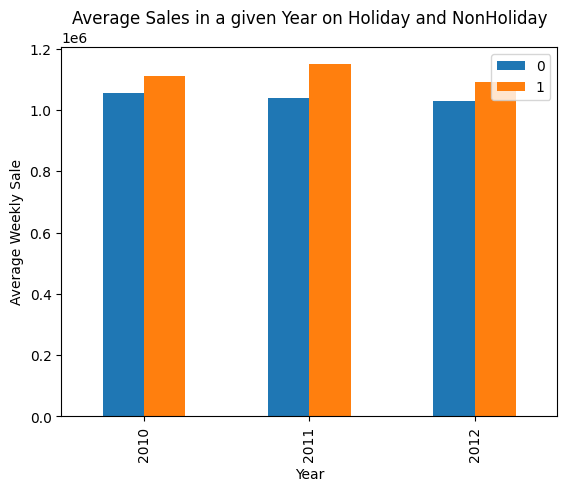

In [ ]:
plt.figure(figsize = (25, 25))
Holiday_pivot.plot(kind = 'bar')
plt.title('Average Sales in a given Year on Holiday and NonHoliday', color = 'black')
plt.ylabel('Average Weekly Sale', color = 'black')
plt.legend()
plt.show()


In [ ]:
df.groupby(['Year'])['Holiday_Flag'].value_counts()/df.groupby(['Year'])['Holiday_Flag'].count()

Year  Holiday_Flag
2010  0               0.916667
      1               0.083333
2011  0               0.923077
      1               0.076923
2012  0               0.953488
      1               0.046512
Name: Holiday_Flag, dtype: float64

Here we can observe that the holidays are on an average 7% of the days in a year.

<Axes: title={'center': 'Correlation Matrix'}>

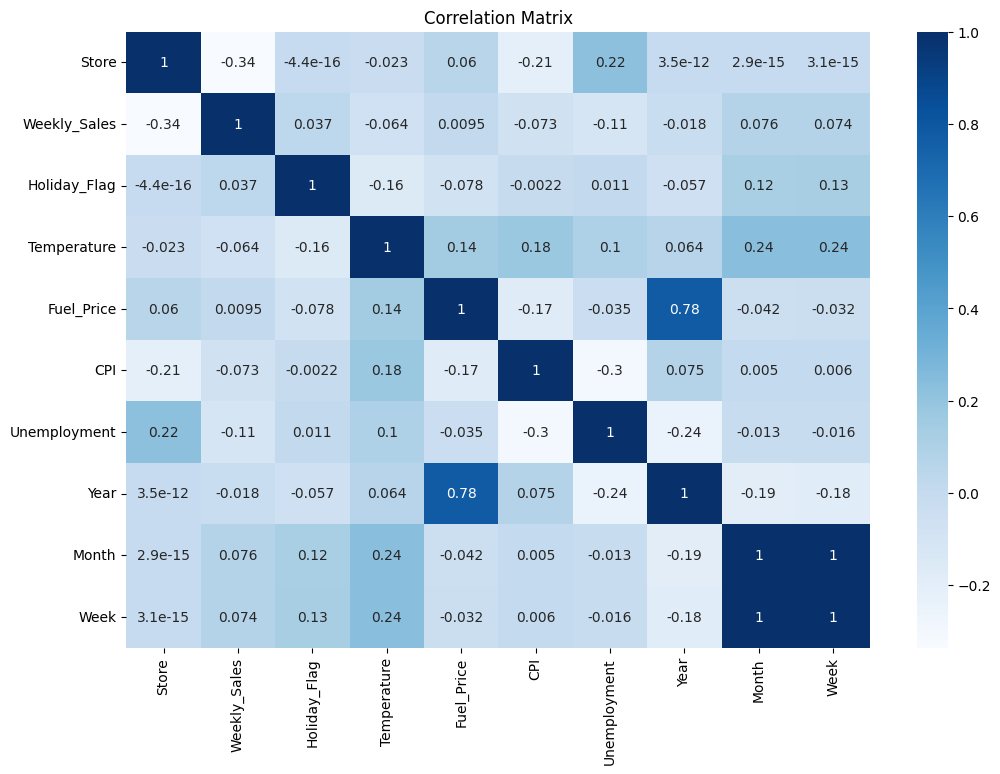

In [ ]:
plt.figure(figsize = (12,8))
plt.title('Correlation Matrix')
sns.heatmap(df.corr(),annot = True, cmap = 'Blues')

## Checking if data is stationary or not

In [ ]:
# Cheking Stationary of the data
# Dicky Fuller Test
from statsmodels.tsa.stattools import adfuller


In [ ]:
for i in range(1,46):
    store = df[df['Store'] == i].sort_values(by = 'Date')
    store = store[['Date','Weekly_Sales']].set_index('Date')
    result = adfuller(store)

#     print(f'ADF Statistic : {result[0]}')
#     print(f'p_value : {result[1]}')
#     print(f'n_lags : {result[2]}')


    if result[1] > 0.05:
        print(f'The data is not statioary in store{i}')
    else:
        print(f'The data is stationary in store{i}')


The data is stationary in store1
The data is stationary in store2
The data is stationary in store3
The data is stationary in store4
The data is stationary in store5
The data is stationary in store6
The data is stationary in store7
The data is stationary in store8
The data is stationary in store9
The data is stationary in store10
The data is stationary in store11
The data is stationary in store12
The data is stationary in store13
The data is not statioary in store14
The data is stationary in store15
The data is stationary in store16
The data is stationary in store17
The data is stationary in store18
The data is stationary in store19
The data is stationary in store20
The data is stationary in store21
The data is stationary in store22
The data is stationary in store23
The data is stationary in store24
The data is stationary in store25
The data is stationary in store26
The data is stationary in store27
The data is stationary in store28
The data is stationary in store29
The data is not stat

In [ ]:
# Here the season pattern is repeatiing after 52 weeks.
# For stores 14, 30, 36, 38, 42, 43, 44 the data is not staationary but we are assuming them as our stationary dataset as majaority of the store are performing in a same pattern.

**Model Building**

In [ ]:
#  importing acf and plot_acf
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf

# ACF plots

In [ ]:
plt.figure(figsize = (25,25))
df_list = []
for i in range(1,46):
    store = df[df['Store'] == i].sort_values(by = 'Date')
    store = store[['Date','Weekly_Sales']].set_index('Date')
    acf_plot = store.dropna()
    df_list.append(acf_plot)







<Figure size 2500x2500 with 0 Axes>

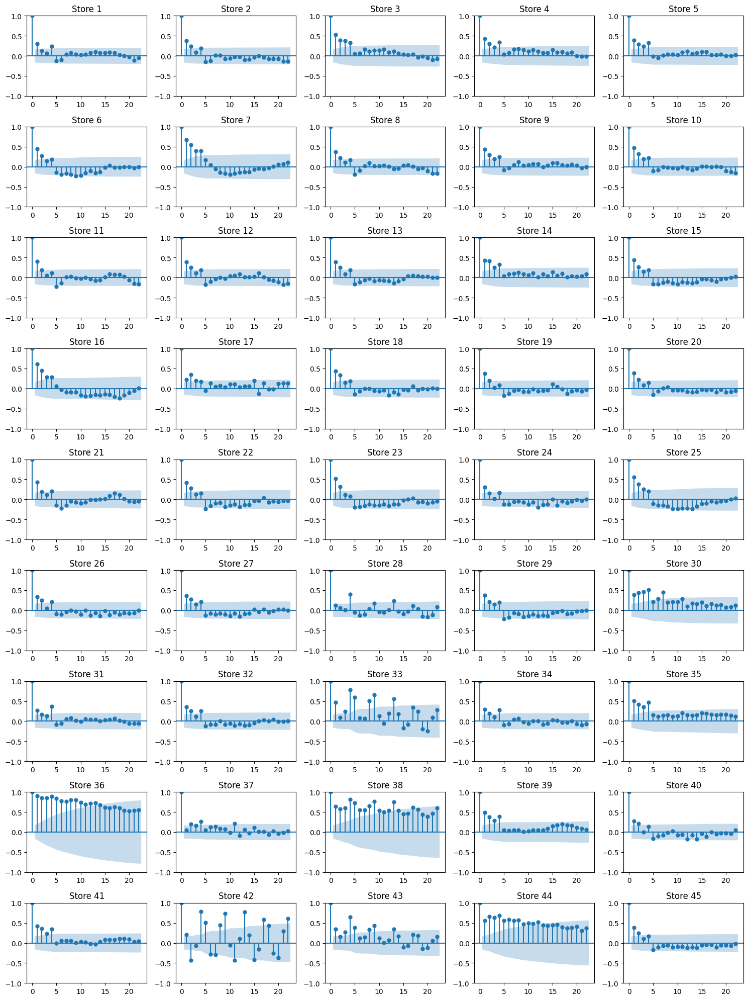

In [ ]:
# Create a figure and subplots
fig, axes = plt.subplots(nrows=9, ncols=5, figsize=(15, 20))

# Iterate through the dataframes and plot ACF on each subplot
for i, acf_df in enumerate(df_list):
    # Calculate ACF using the statsmodels plot_acf function
    plot_acf(acf_df, ax=axes[i//5, i%5])

    # Set the title for each subplot
    axes[i//5, i%5].set_title(f'Store {i+1}')

# Adjust the layout and spacing
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# importing pacf and pacf_plot
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_pacf

# Pacf plots

In [ ]:
plt.figure(figsize = (25,25))
df_list_new = []
for i in range(1,46):
    store = df[df['Store'] == i].sort_values(by = 'Date')
    store = store[['Date','Weekly_Sales']].set_index('Date')
    pacf_plot = store.dropna()
    df_list_new.append(pacf_plot)





<Figure size 2500x2500 with 0 Axes>

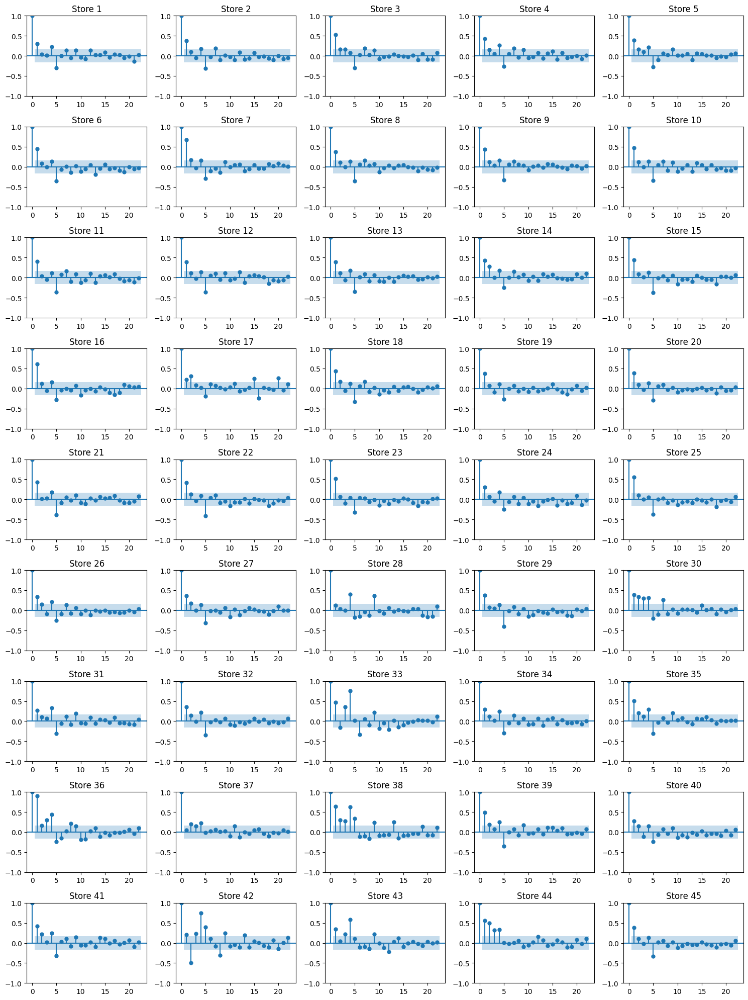

In [ ]:
# Create a figure and subplots
fig, axes = plt.subplots(nrows=9, ncols=5, figsize=(15, 20))

# Iterate through the dataframes and plot ACF on each subplot
for i, pacf_df in enumerate(df_list_new):
    # Calculate ACF using the statsmodels plot_acf function
    plot_pacf(pacf_df, ax=axes[i//5, i%5])

    # Set the title for each subplot
    axes[i//5, i%5].set_title(f'Store {i+1}')

# Adjust the layout and spacing
plt.tight_layout()

# Show the plot
plt.show()

# Splitting the data into training and testing

In [ ]:
#  List consist of all the data frames : df_list
# splitting all the data into training and testing
train_df = []
test_df = []
for x in df_list:
  train = x.iloc[:120 ]['Weekly_Sales']
  test= x.iloc[120:]['Weekly_Sales']
  train_df.append(train)
  test_df.append(test)

Datasets:  



---



---



1. list of dataframes for all the different stores : df_list
2. list of train dataframes for all the different stores : train_df
3. list of test dataframes for all the different stores : test_df


---



ARIMA MODEL
FINDING OUT THE BEST p, d, q VALUES FOR EACH DATASET

In [ ]:
# ## How to find the ideal values for p,d,q:

# import itertools

# p = range(0,8)
# q = range(0,8)
# d = range(0,2)

# pdq_combination = list(itertools.product(p,d,q))
# pdq_combination


# print(len(pdq_combination)) #total combinations of p,d,q

# from sklearn.metrics import *
# rmse = []
# order1 = []

# for pdq in pdq_combination:
#         #model = ARIMA(train, order=pdq).fit()
#         model = ARIMA(train_df[1],order=pdq)
#         model_fit=model.fit()
#         pred = model_fit.predict(start=len(train_df[1]),end=len(train_df[1])+len(test_df[1])-1, dynamic=True)
#         error = np.sqrt(mean_squared_error(test_df[1], pred))
#         order1.append(pdq)
#         rmse.append(error)


# results = pd.DataFrame(index=order1, data=rmse, columns=['RMSE'])
# results.sort_values("RMSE") #Least RMSE score are best hyperparamterer for (p,d,q) values




Importing Models

In [ ]:
#  Importing ARIMA model and SARIMAX Model
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

from sklearn.metrics import *
import warnings
warnings.filterwarnings('ignore')

Model Training and Forecasting

rmse for true values (test) and predicted (ARIMA) for store 1 : 84251.24469271746
rmse for true values (test) and predicted (SARIMAX) for store1 : 54465.314021180224


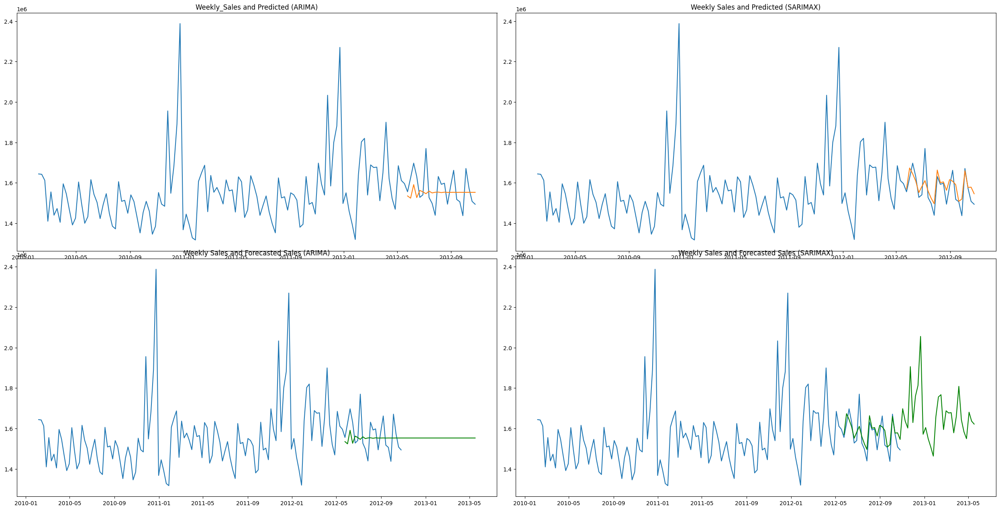

rmse for true values (test) and predicted (ARIMA) for store 2 : 87026.81333929047
rmse for true values (test) and predicted (SARIMAX) for store2 : 57369.29837082192


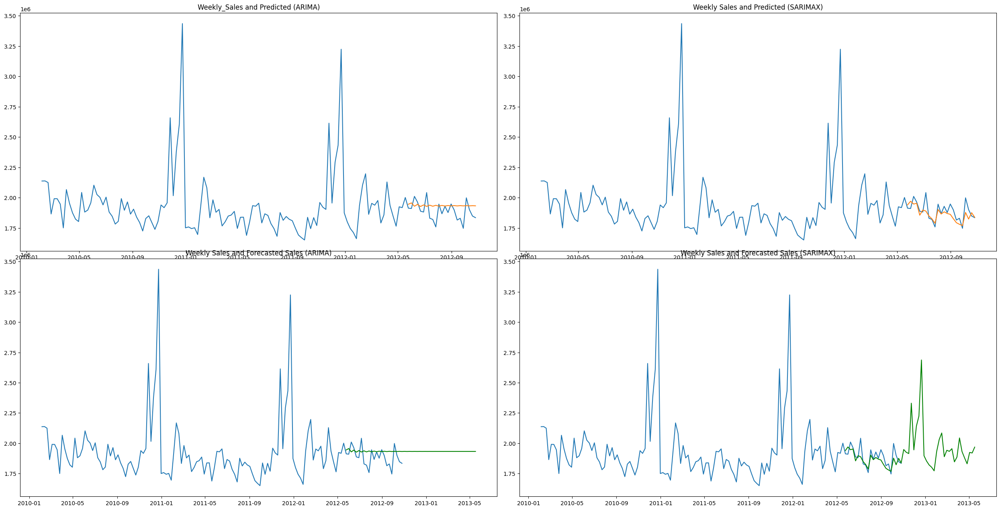

rmse for true values (test) and predicted (ARIMA) for store 3 : 19627.816210908477
rmse for true values (test) and predicted (SARIMAX) for store3 : 13036.840377457824


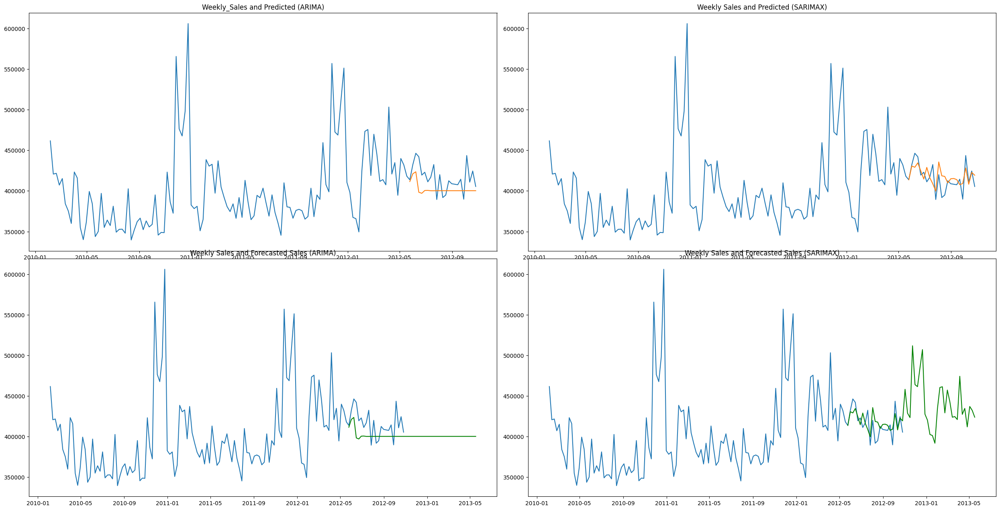

rmse for true values (test) and predicted (ARIMA) for store 4 : 68079.9596636623
rmse for true values (test) and predicted (SARIMAX) for store4 : 73732.13562215348


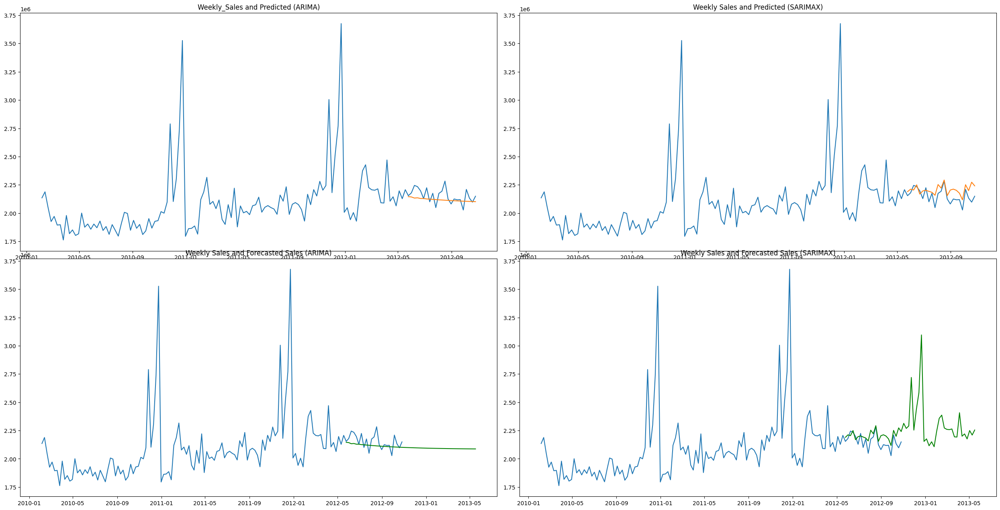

rmse for true values (test) and predicted (ARIMA) for store 5 : 15312.582714523514
rmse for true values (test) and predicted (SARIMAX) for store5 : 13670.357636509678


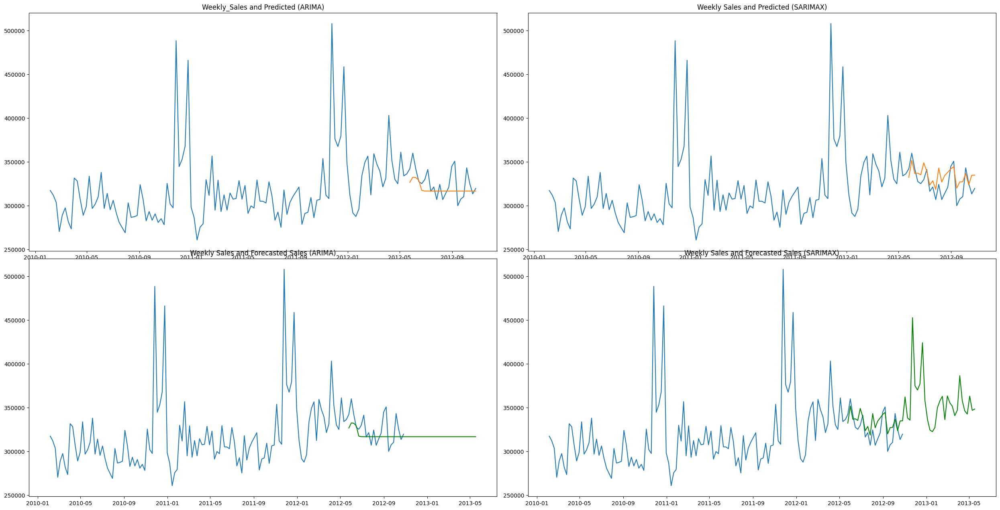

rmse for true values (test) and predicted (ARIMA) for store 6 : 114918.79784920164
rmse for true values (test) and predicted (SARIMAX) for store6 : 71043.50958829572


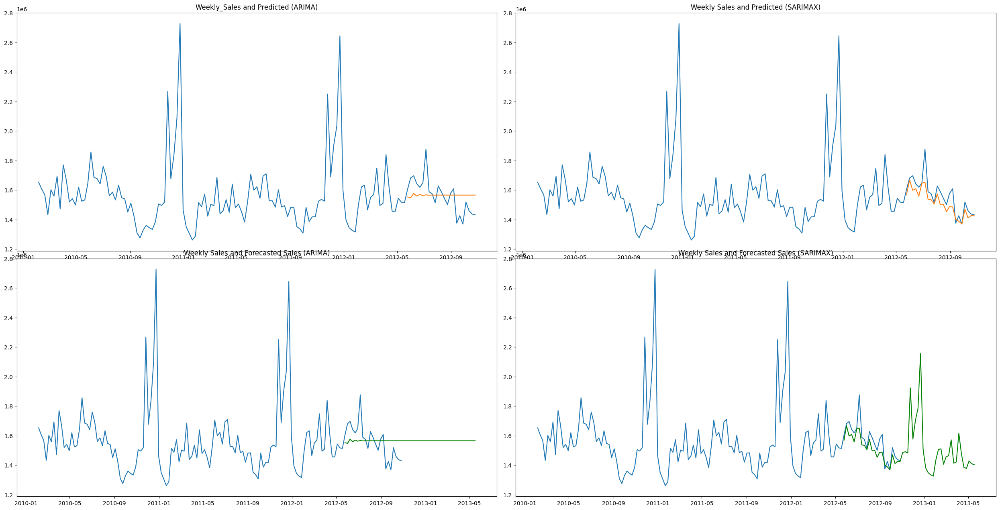

rmse for true values (test) and predicted (ARIMA) for store 7 : 102825.94401847708
rmse for true values (test) and predicted (SARIMAX) for store7 : 90962.08735305158


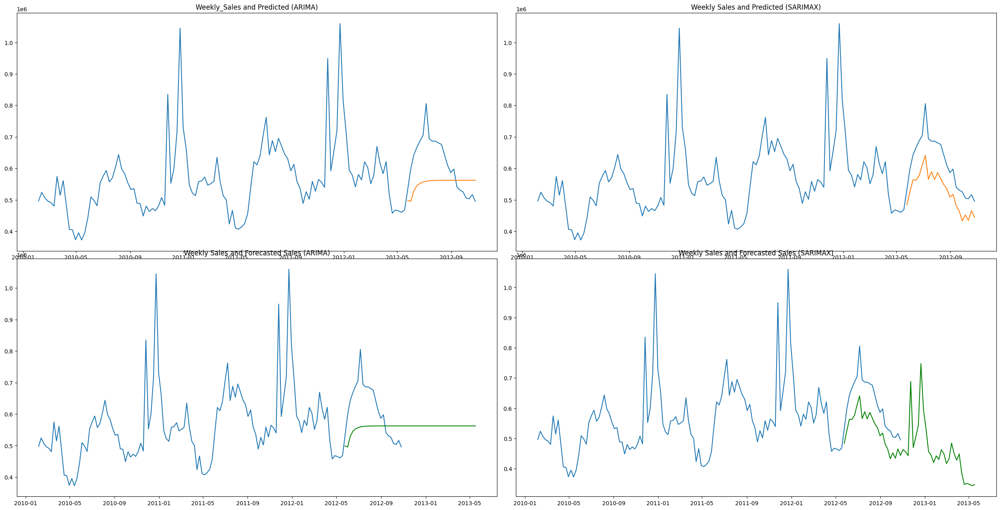

rmse for true values (test) and predicted (ARIMA) for store 8 : 32199.729393030422
rmse for true values (test) and predicted (SARIMAX) for store8 : 27146.498059903148


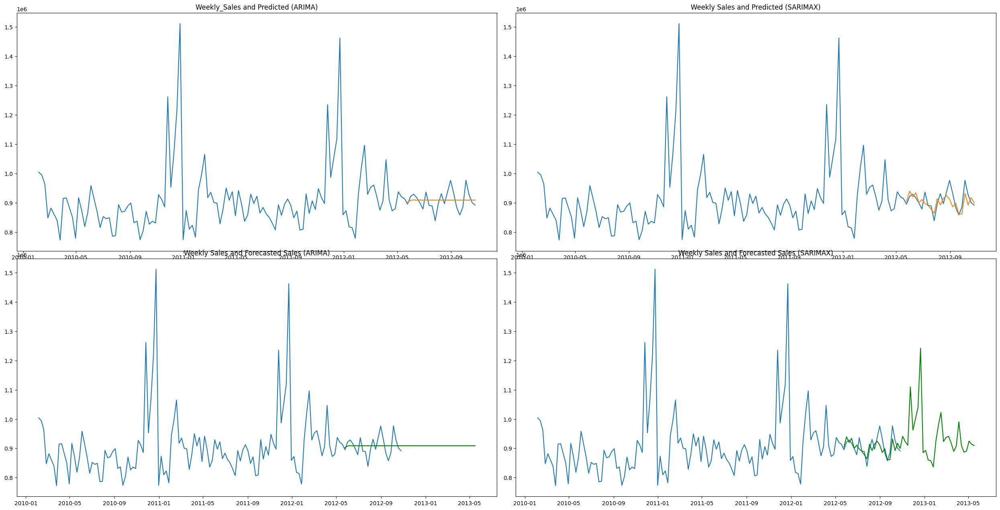

rmse for true values (test) and predicted (ARIMA) for store 9 : 25677.174383791076
rmse for true values (test) and predicted (SARIMAX) for store9 : 28264.4082547939


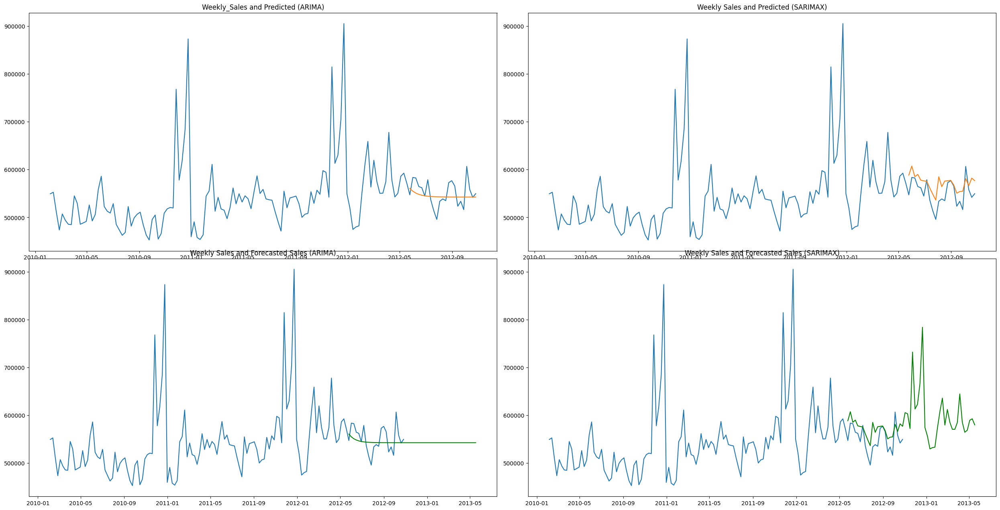

rmse for true values (test) and predicted (ARIMA) for store 10 : 167180.53867814533
rmse for true values (test) and predicted (SARIMAX) for store10 : 52308.98888002644


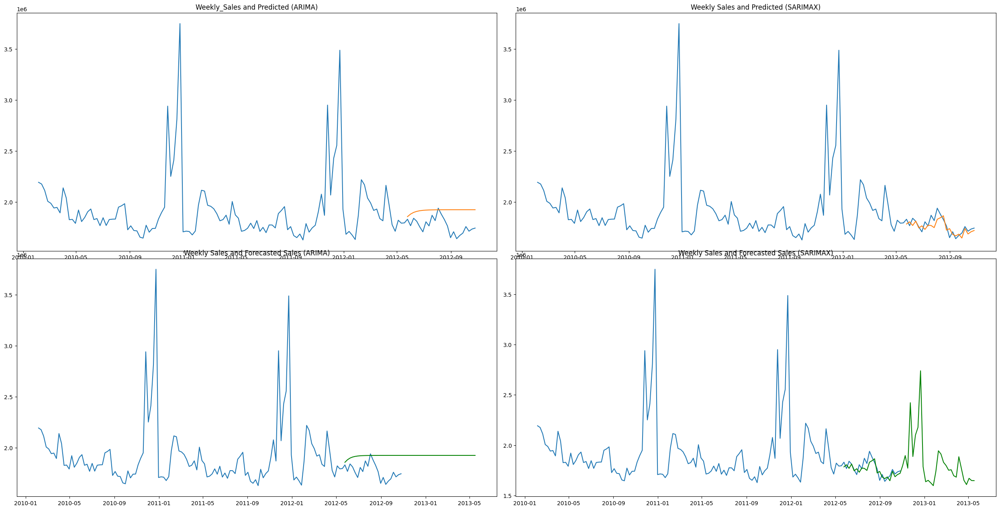

rmse for true values (test) and predicted (ARIMA) for store 11 : 72272.9810530037
rmse for true values (test) and predicted (SARIMAX) for store11 : 59824.7058593258


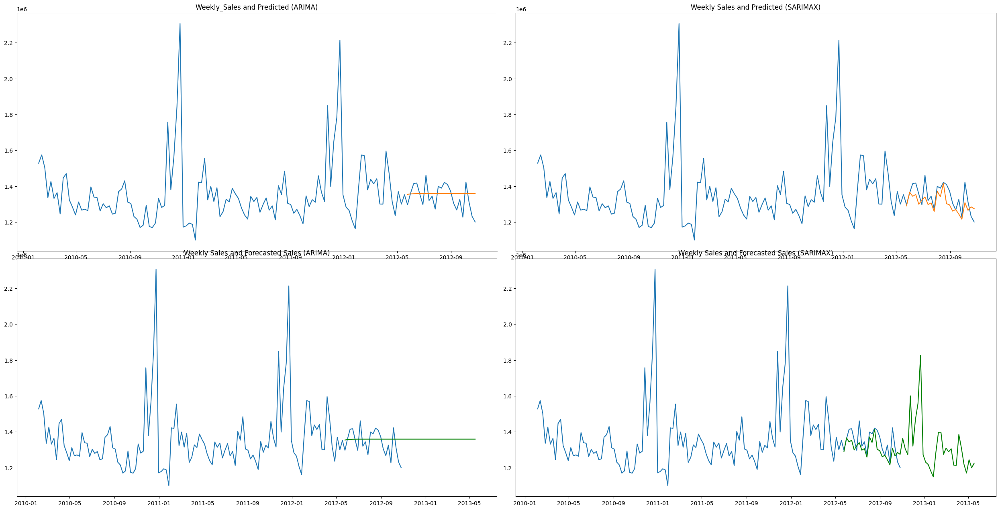

rmse for true values (test) and predicted (ARIMA) for store 12 : 65792.63600907083
rmse for true values (test) and predicted (SARIMAX) for store12 : 56924.71372578807


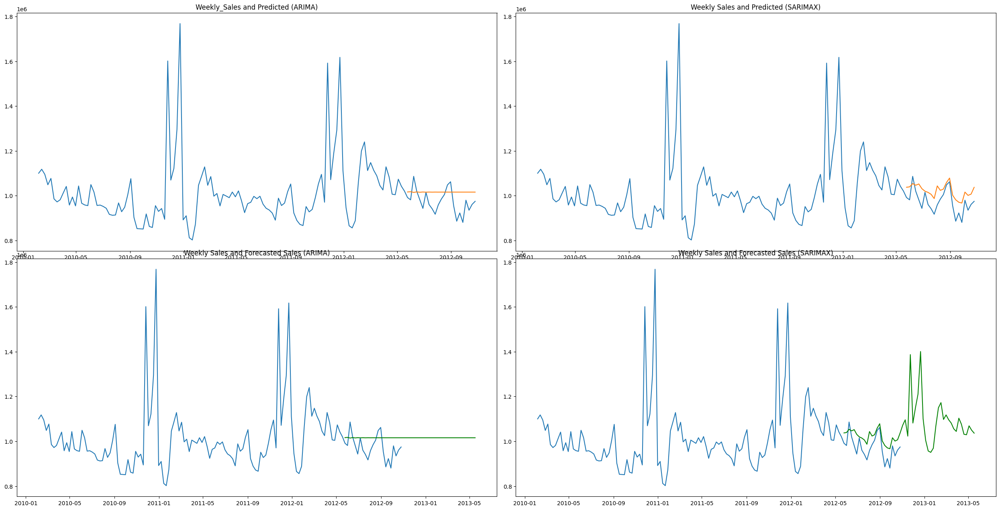

rmse for true values (test) and predicted (ARIMA) for store 13 : 91101.42006503842
rmse for true values (test) and predicted (SARIMAX) for store13 : 65190.014039809794


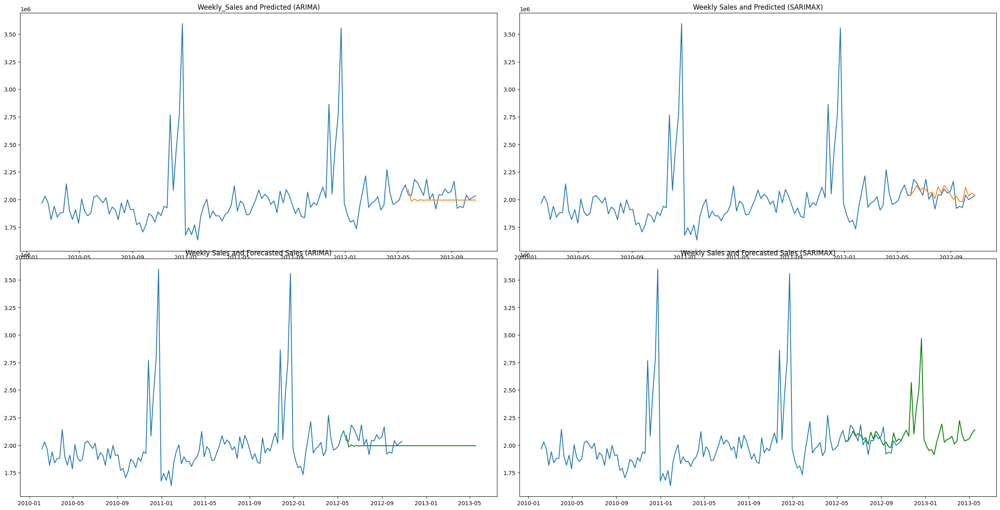

rmse for true values (test) and predicted (ARIMA) for store 14 : 417740.1324603424
rmse for true values (test) and predicted (SARIMAX) for store14 : 307806.5890112719


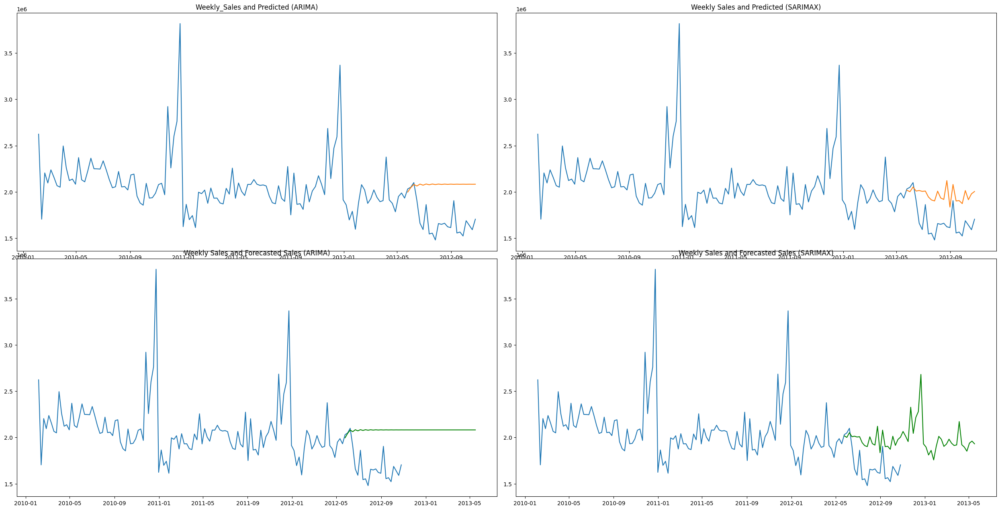

rmse for true values (test) and predicted (ARIMA) for store 15 : 55772.58514908559
rmse for true values (test) and predicted (SARIMAX) for store15 : 46224.770579457436


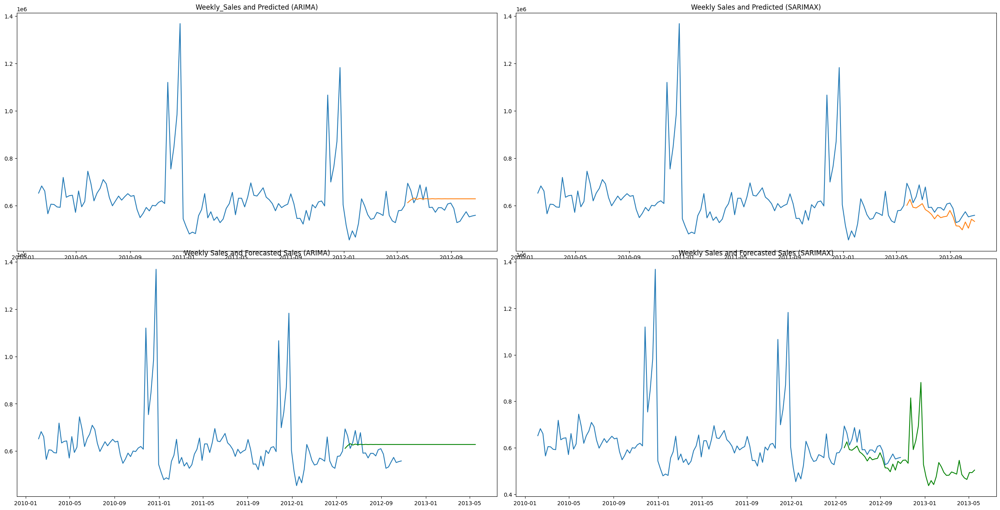

rmse for true values (test) and predicted (ARIMA) for store 16 : 53063.989243232434
rmse for true values (test) and predicted (SARIMAX) for store16 : 26662.81920553996


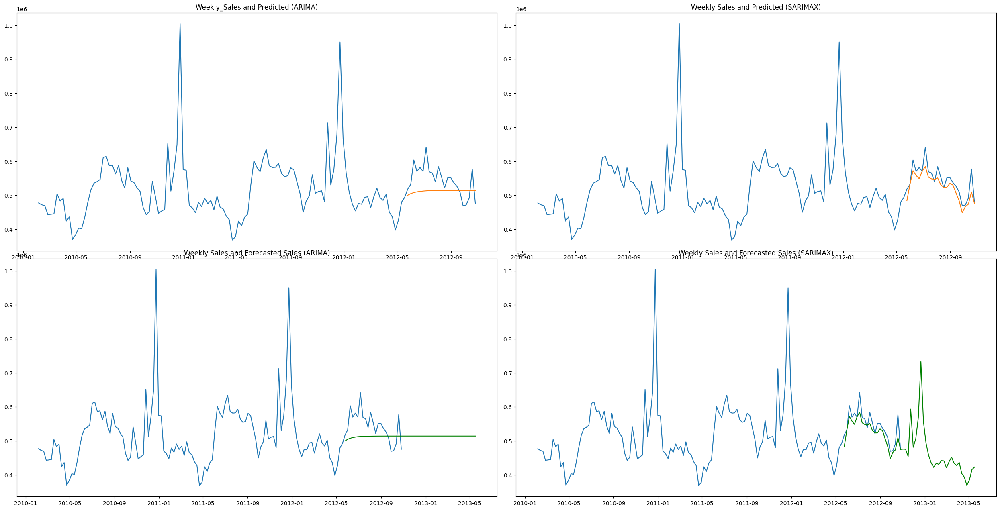

rmse for true values (test) and predicted (ARIMA) for store 17 : 108757.2030306254
rmse for true values (test) and predicted (SARIMAX) for store17 : 45828.308801777705


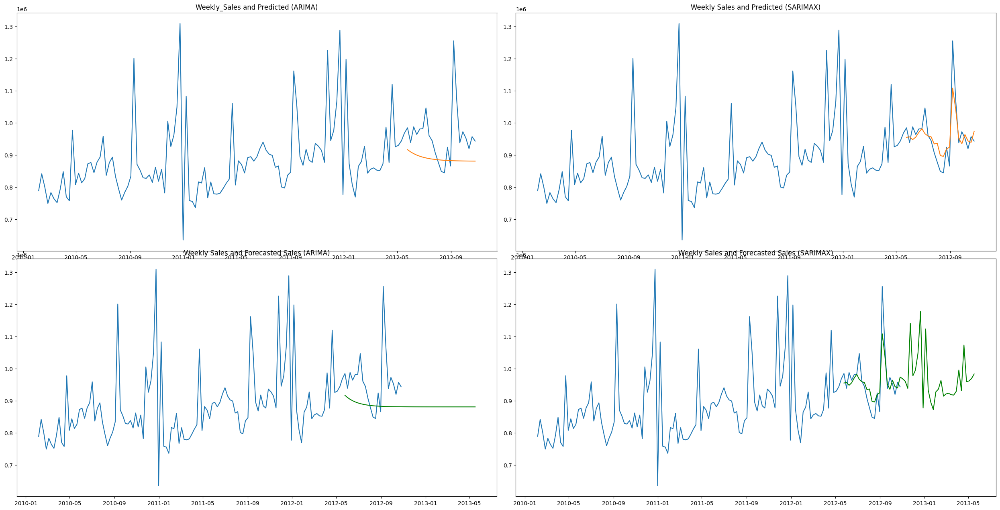

rmse for true values (test) and predicted (ARIMA) for store 18 : 67997.42677388163
rmse for true values (test) and predicted (SARIMAX) for store18 : 106996.72385027797


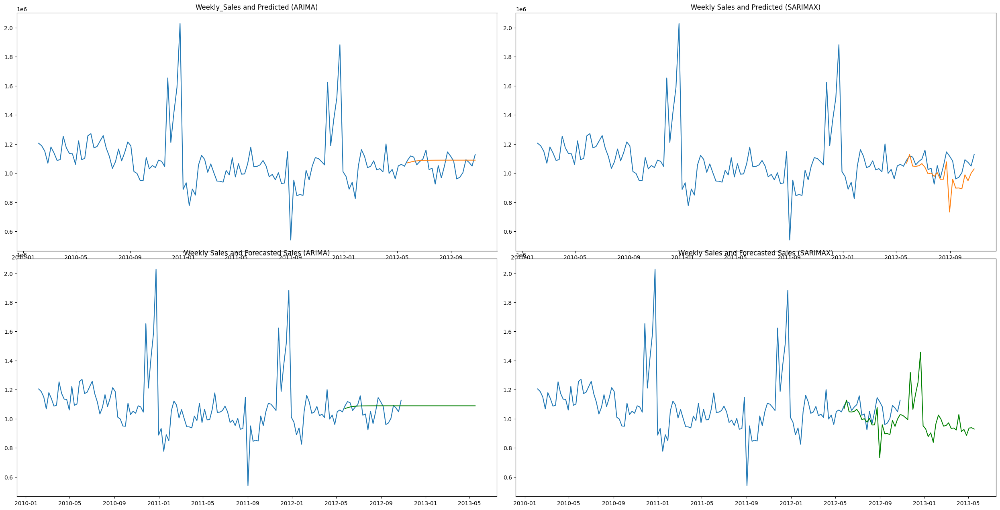

rmse for true values (test) and predicted (ARIMA) for store 19 : 97863.25456651459
rmse for true values (test) and predicted (SARIMAX) for store19 : 67383.70507025273


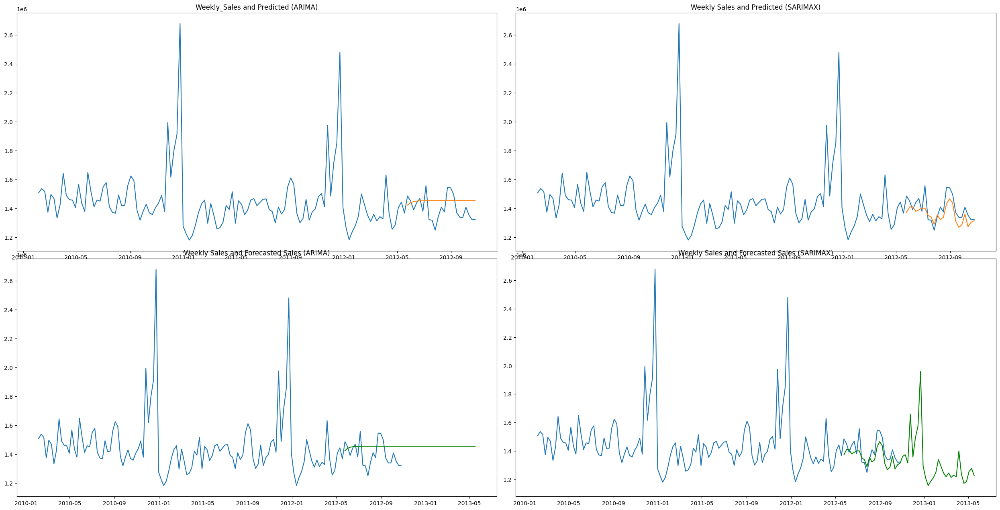

rmse for true values (test) and predicted (ARIMA) for store 20 : 99999.43553774722
rmse for true values (test) and predicted (SARIMAX) for store20 : 93280.49676459758


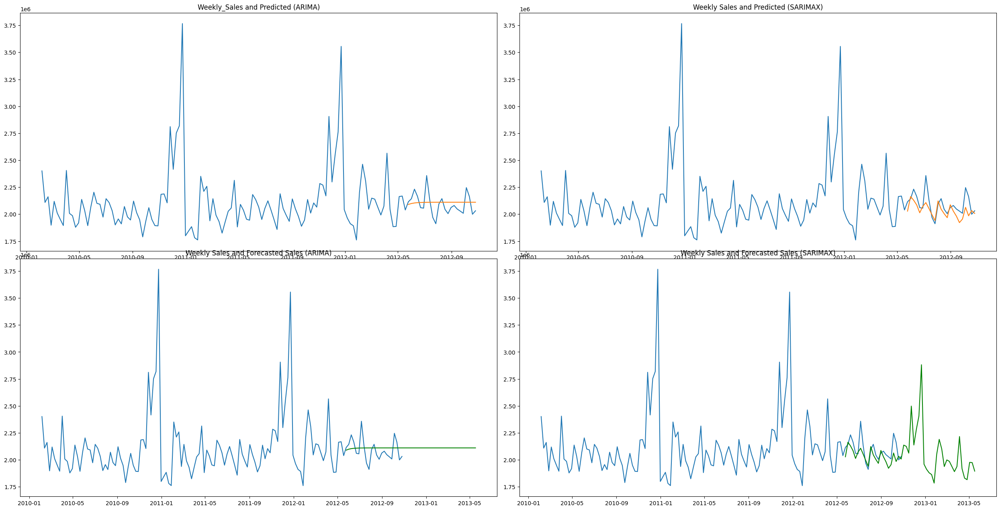

rmse for true values (test) and predicted (ARIMA) for store 21 : 84671.5510782859
rmse for true values (test) and predicted (SARIMAX) for store21 : 50919.19983094874


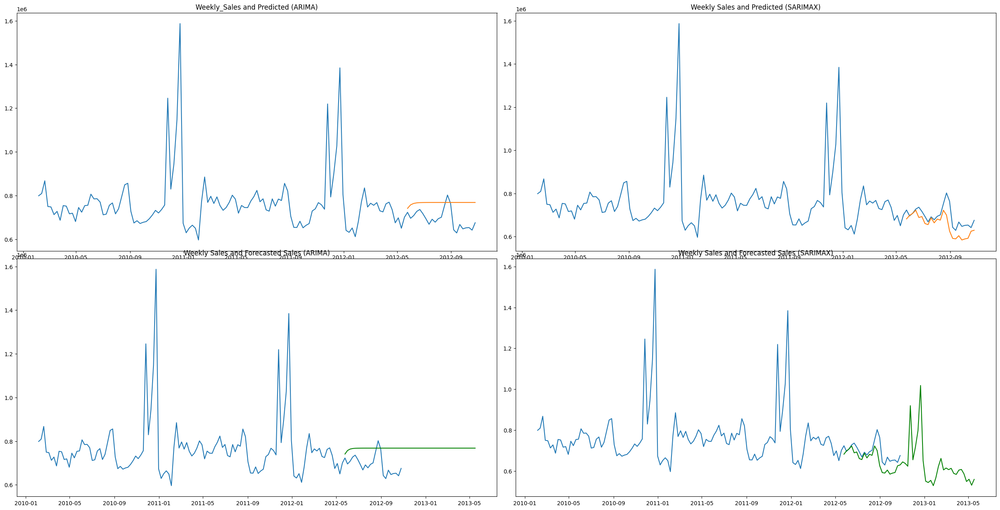

rmse for true values (test) and predicted (ARIMA) for store 22 : 60133.09480268719
rmse for true values (test) and predicted (SARIMAX) for store22 : 59934.18282861485


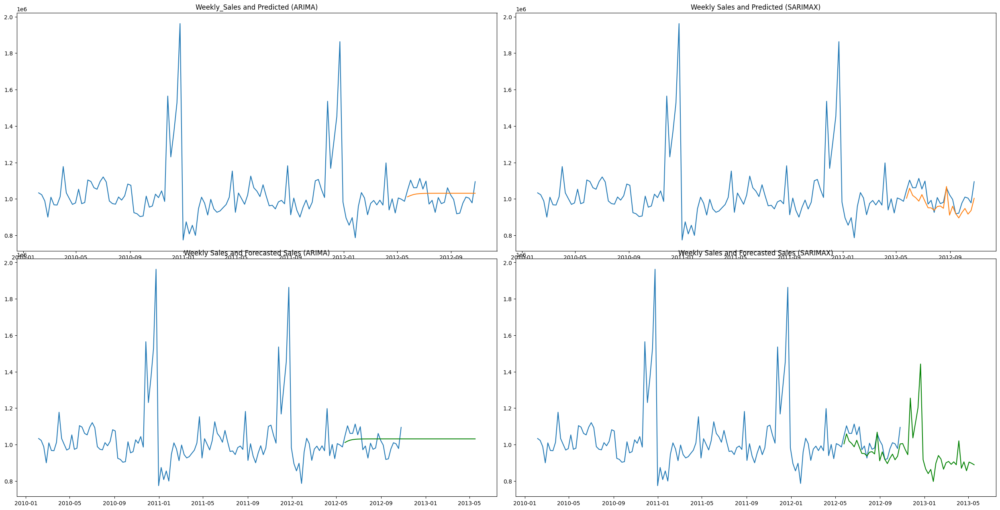

rmse for true values (test) and predicted (ARIMA) for store 23 : 126865.75522641864
rmse for true values (test) and predicted (SARIMAX) for store23 : 162260.62644033038


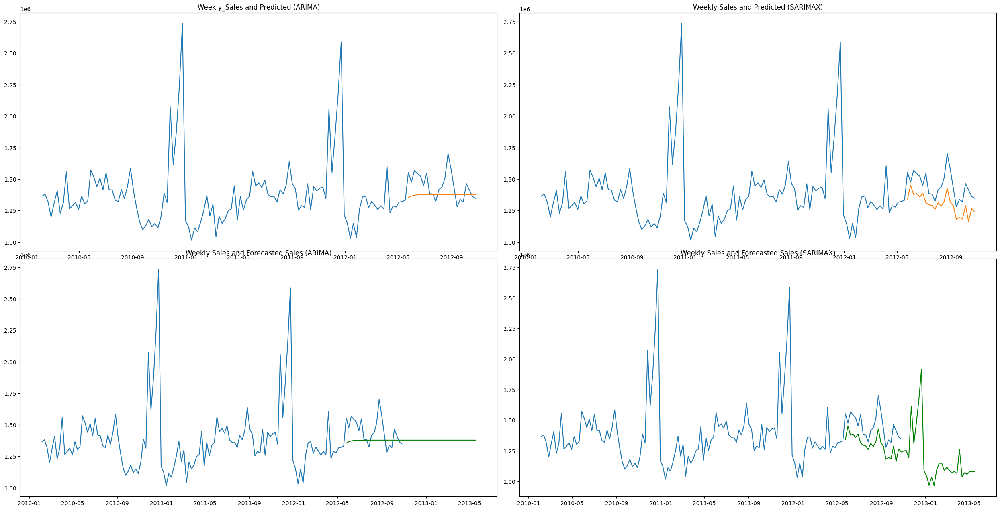

rmse for true values (test) and predicted (ARIMA) for store 24 : 99653.23846087398
rmse for true values (test) and predicted (SARIMAX) for store24 : 82497.18874559572


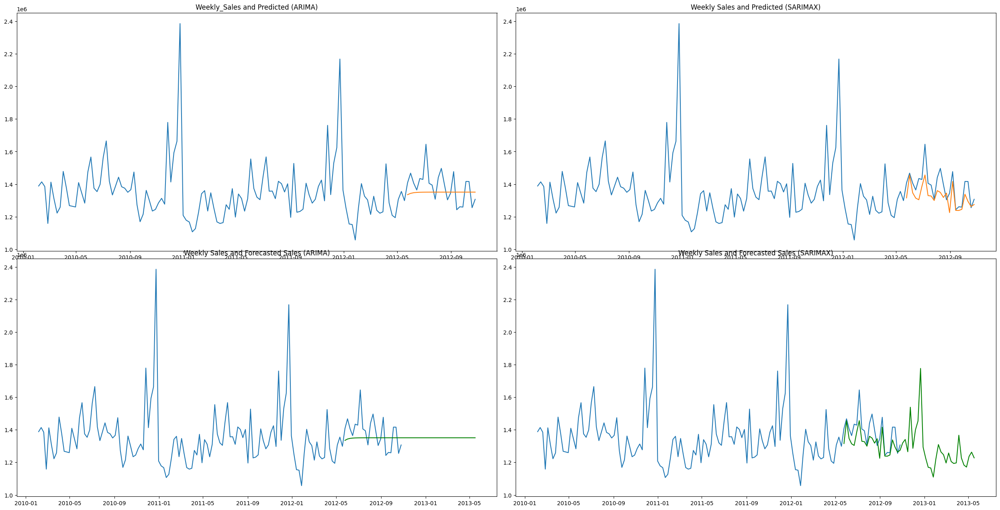

rmse for true values (test) and predicted (ARIMA) for store 25 : 31258.5674469526
rmse for true values (test) and predicted (SARIMAX) for store25 : 39224.735516030356


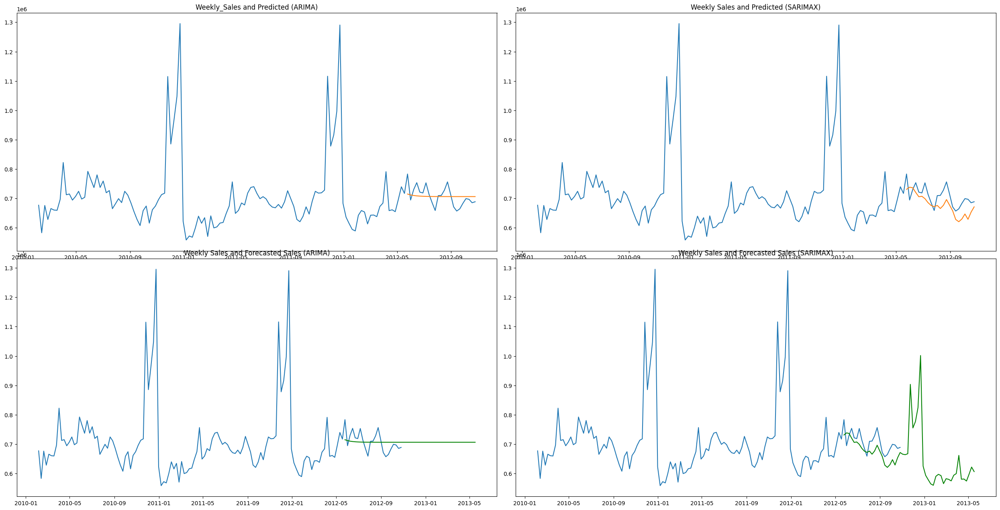

rmse for true values (test) and predicted (ARIMA) for store 26 : 74006.16986335017
rmse for true values (test) and predicted (SARIMAX) for store26 : 43141.413132182955


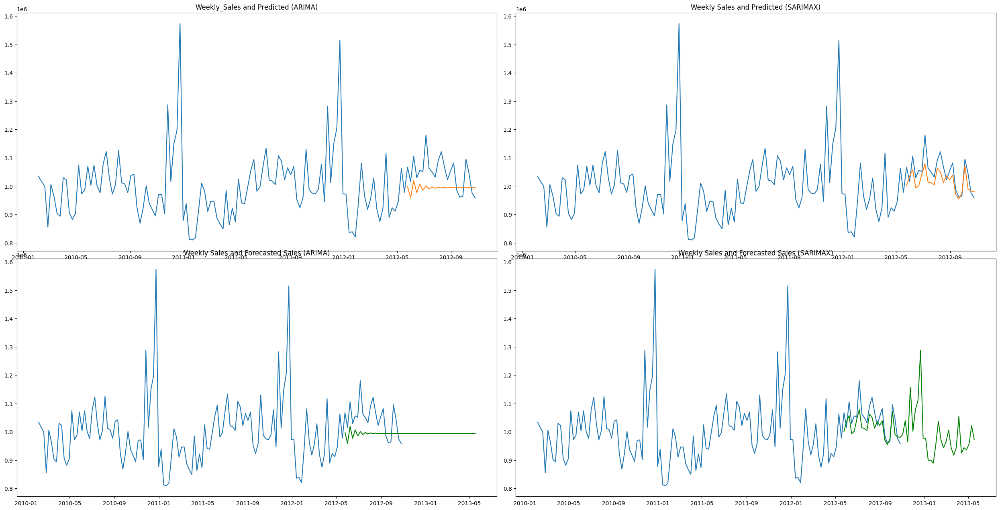

rmse for true values (test) and predicted (ARIMA) for store 27 : 135975.87691832279
rmse for true values (test) and predicted (SARIMAX) for store27 : 76570.58059684566


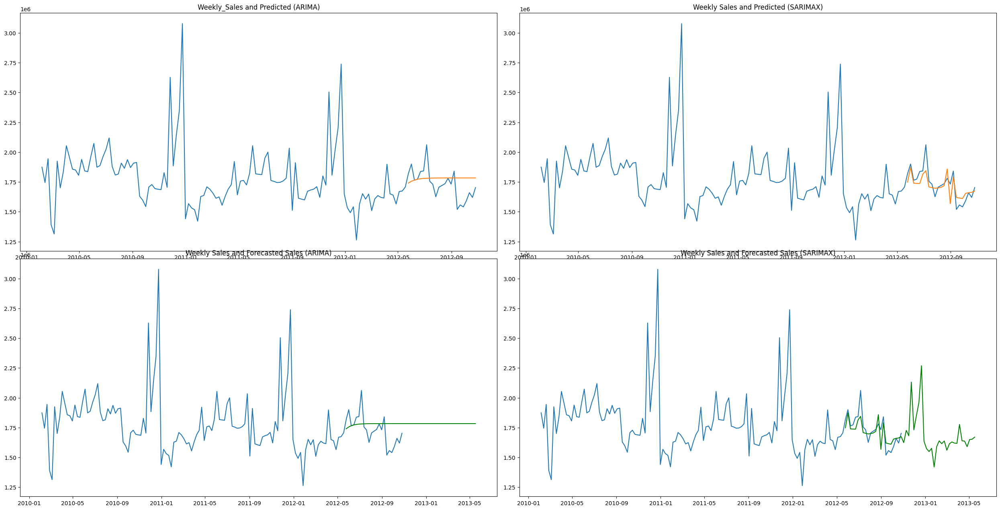

rmse for true values (test) and predicted (ARIMA) for store 28 : 155589.26514510595
rmse for true values (test) and predicted (SARIMAX) for store28 : 103632.76492202391


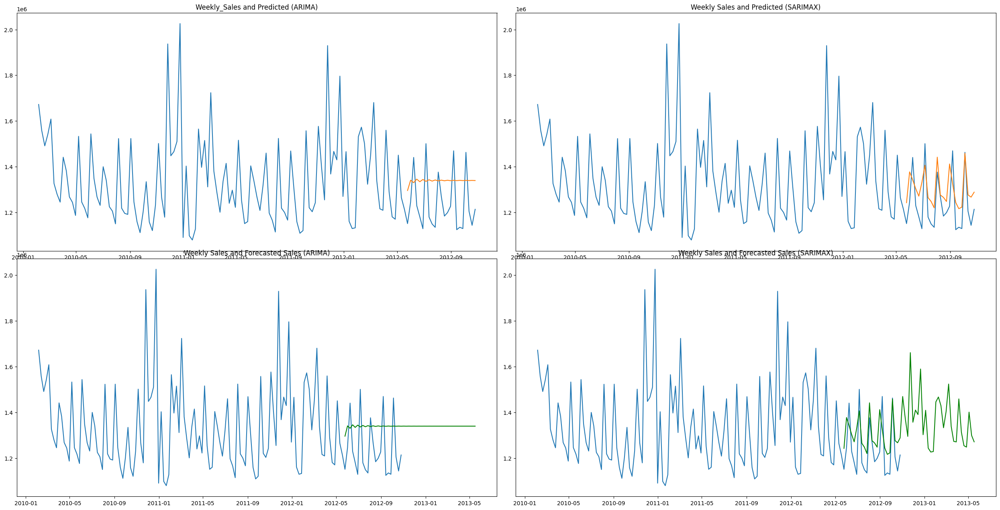

rmse for true values (test) and predicted (ARIMA) for store 29 : 44679.92373617224
rmse for true values (test) and predicted (SARIMAX) for store29 : 40679.53657554825


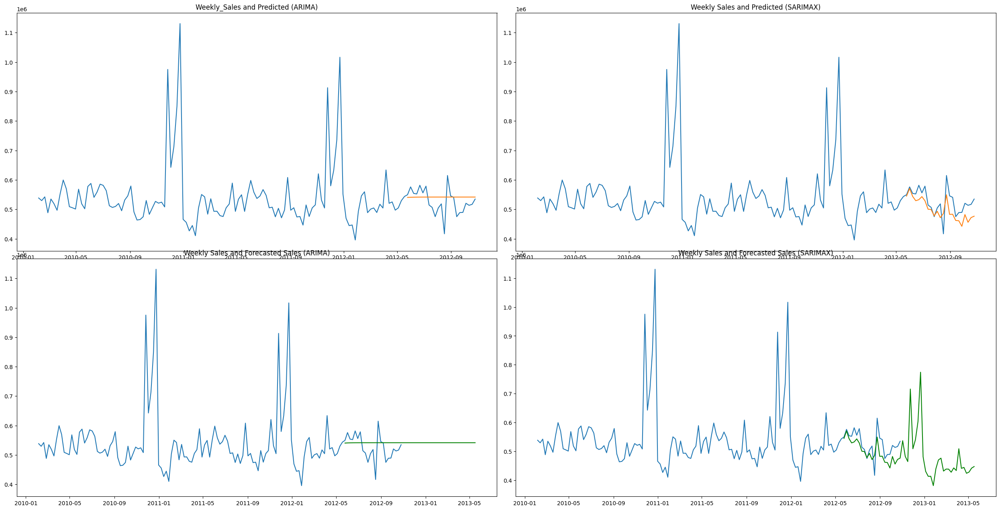

rmse for true values (test) and predicted (ARIMA) for store 30 : 14026.793038833297
rmse for true values (test) and predicted (SARIMAX) for store30 : 12397.697674553934


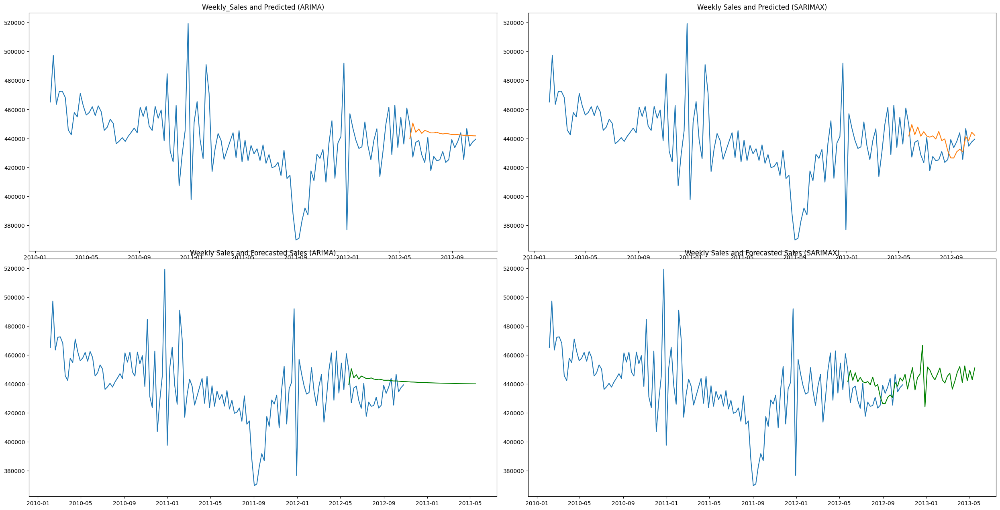

rmse for true values (test) and predicted (ARIMA) for store 31 : 45269.70496414037
rmse for true values (test) and predicted (SARIMAX) for store31 : 36248.384304012325


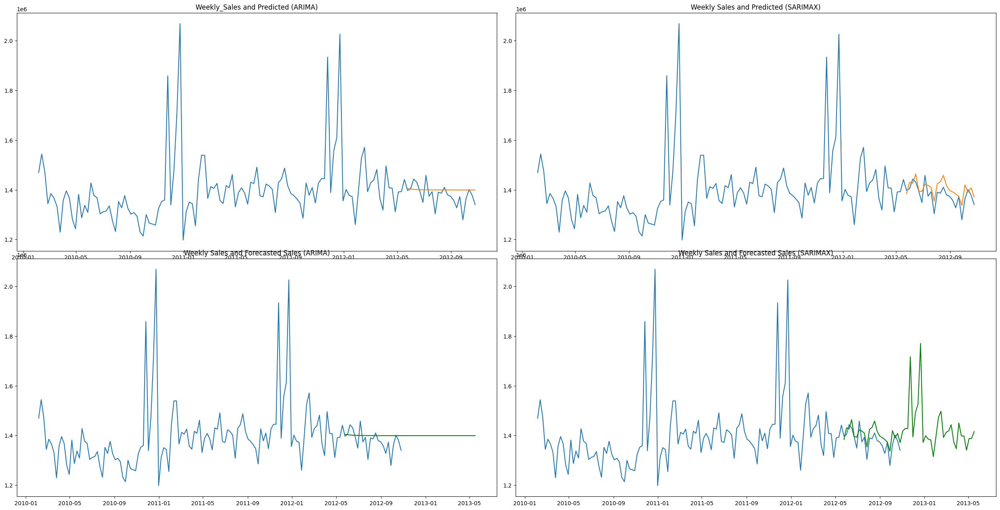

rmse for true values (test) and predicted (ARIMA) for store 32 : 48977.67319641323
rmse for true values (test) and predicted (SARIMAX) for store32 : 53436.22014323582


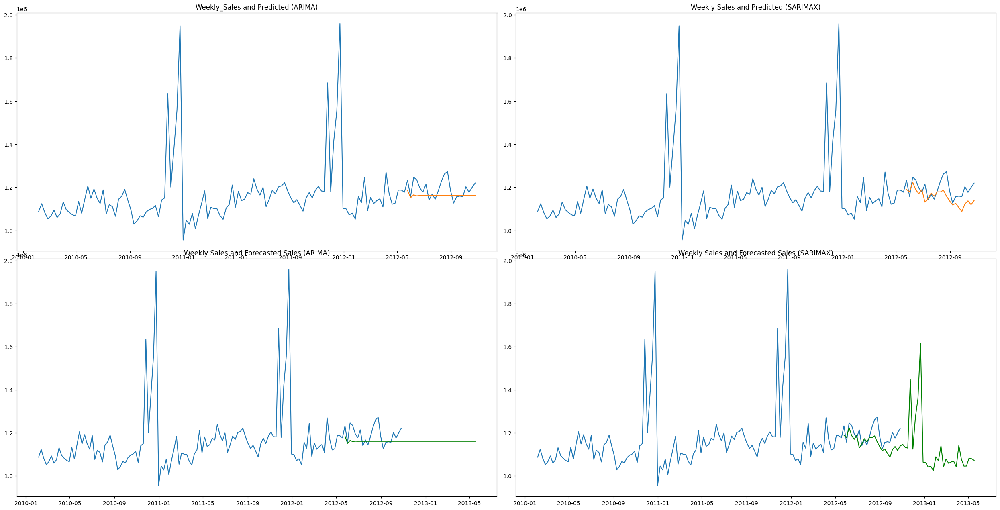

rmse for true values (test) and predicted (ARIMA) for store 33 : 9610.404125884761
rmse for true values (test) and predicted (SARIMAX) for store33 : 8832.17967684722


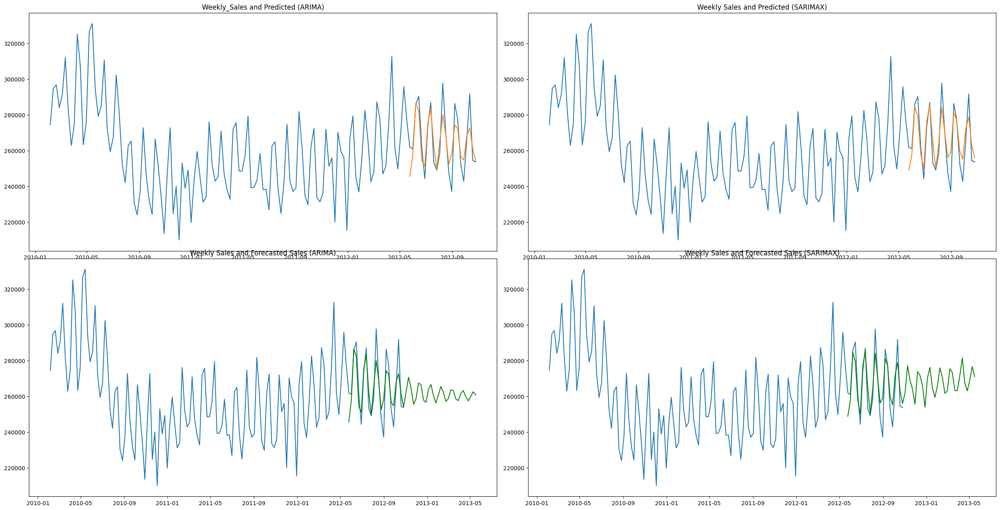

rmse for true values (test) and predicted (ARIMA) for store 34 : 28193.562308297885
rmse for true values (test) and predicted (SARIMAX) for store34 : 26820.311495777507


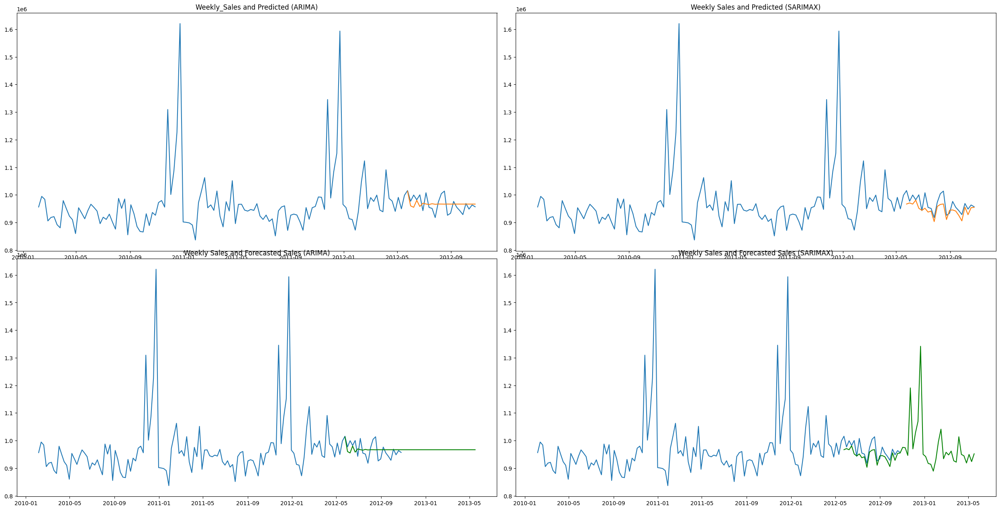

rmse for true values (test) and predicted (ARIMA) for store 35 : 77902.13556054312
rmse for true values (test) and predicted (SARIMAX) for store35 : 118873.7876694205


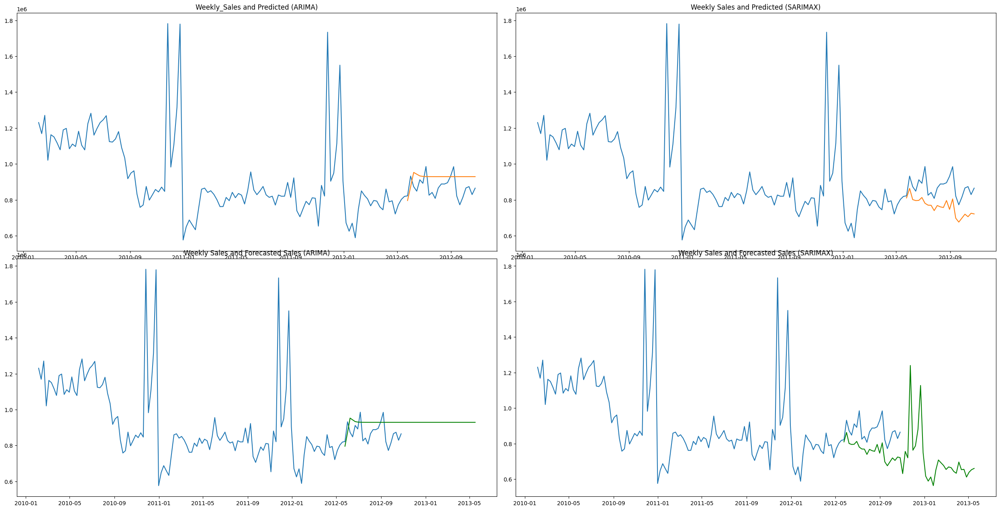

rmse for true values (test) and predicted (ARIMA) for store 36 : 36809.95794670926
rmse for true values (test) and predicted (SARIMAX) for store36 : 19673.837165746358


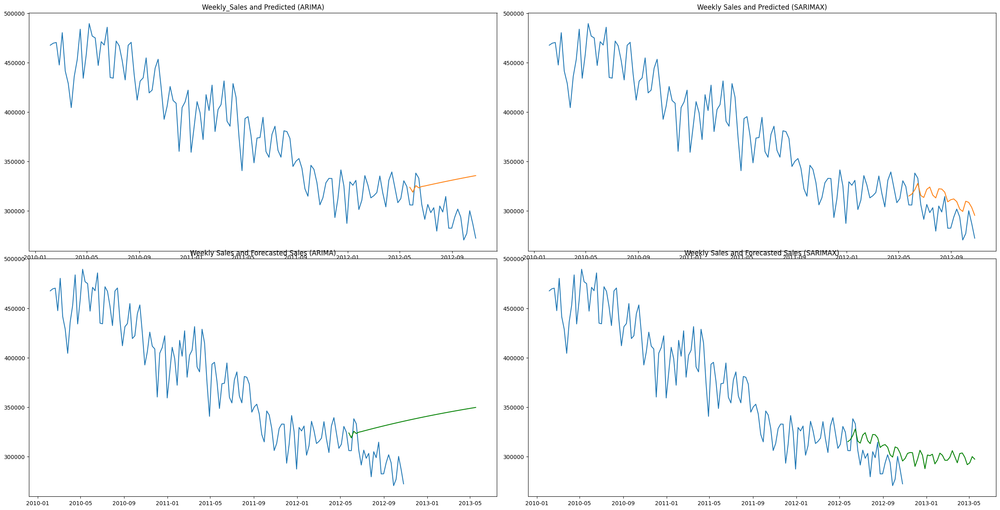

rmse for true values (test) and predicted (ARIMA) for store 37 : 16017.18448930125
rmse for true values (test) and predicted (SARIMAX) for store37 : 14441.719429708546


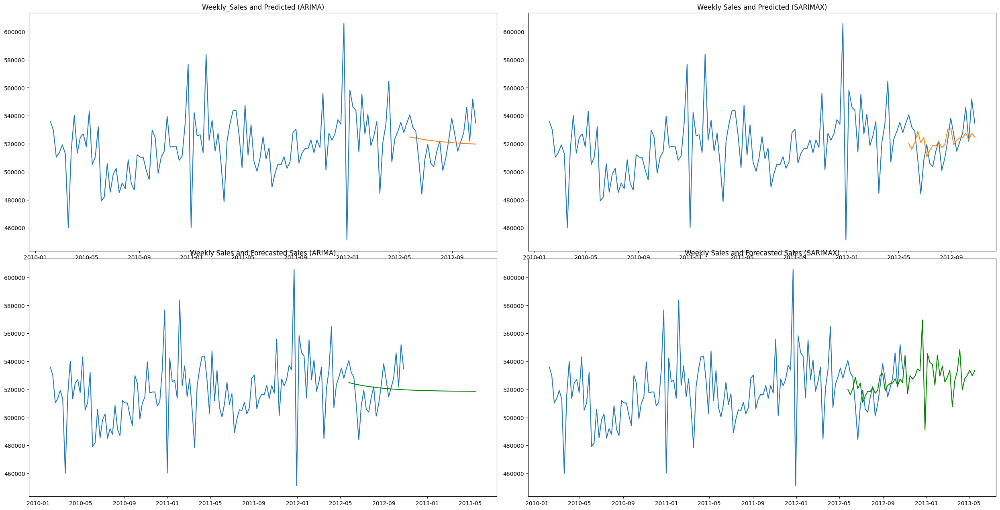

rmse for true values (test) and predicted (ARIMA) for store 38 : 19474.867510198932
rmse for true values (test) and predicted (SARIMAX) for store38 : 20089.824744480058


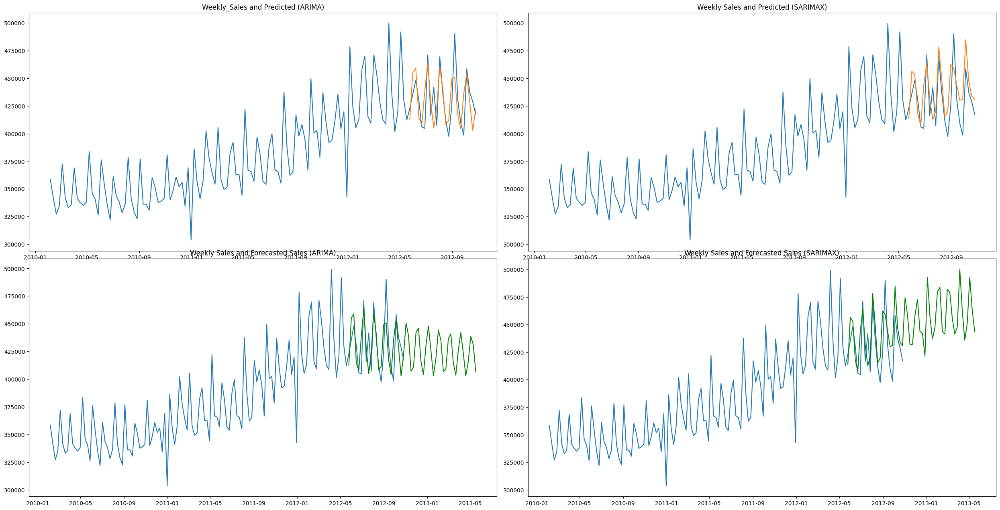

rmse for true values (test) and predicted (ARIMA) for store 39 : 165045.72495647368
rmse for true values (test) and predicted (SARIMAX) for store39 : 60948.94398732713


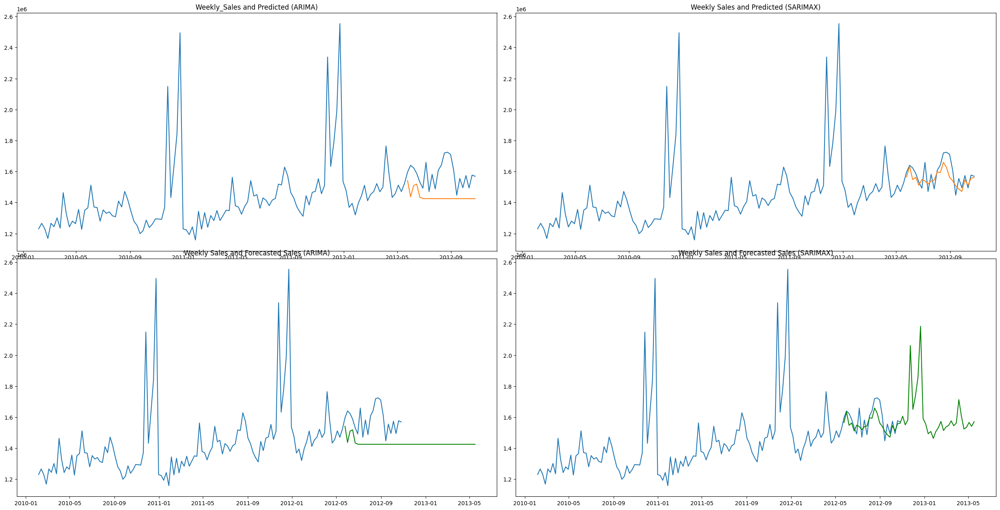

rmse for true values (test) and predicted (ARIMA) for store 40 : 78283.91147111263
rmse for true values (test) and predicted (SARIMAX) for store40 : 60489.46177023462


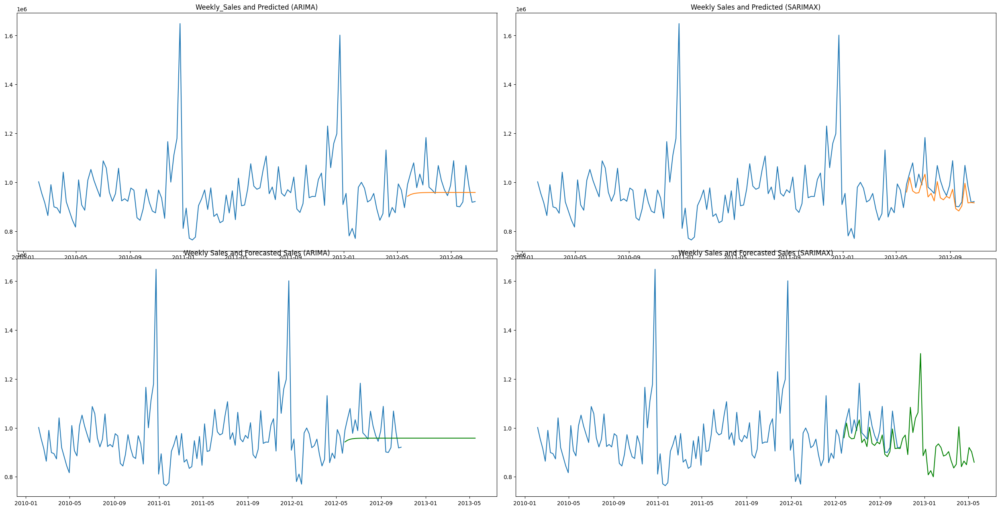

rmse for true values (test) and predicted (ARIMA) for store 41 : 139919.9575971886
rmse for true values (test) and predicted (SARIMAX) for store41 : 69866.5586537037


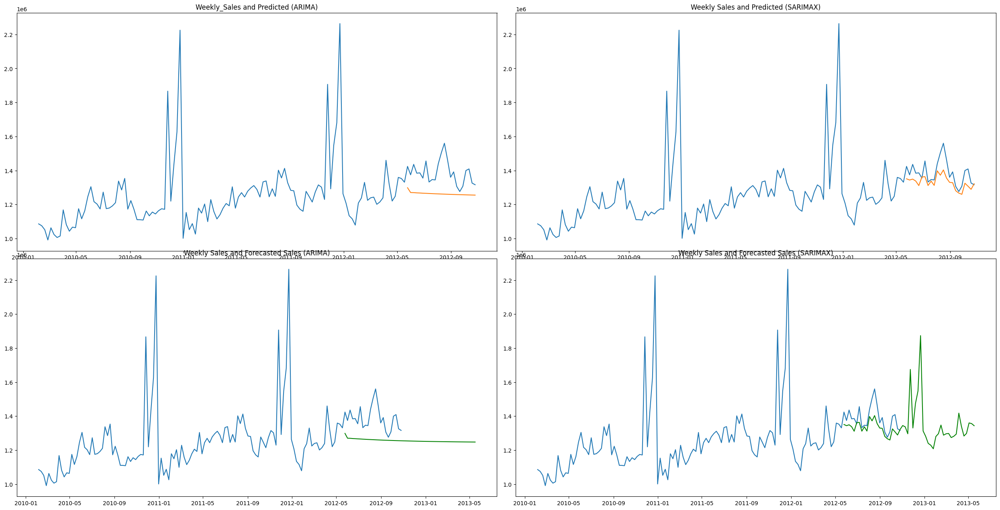

rmse for true values (test) and predicted (ARIMA) for store 42 : 20484.025942485572
rmse for true values (test) and predicted (SARIMAX) for store42 : 35650.351585254444


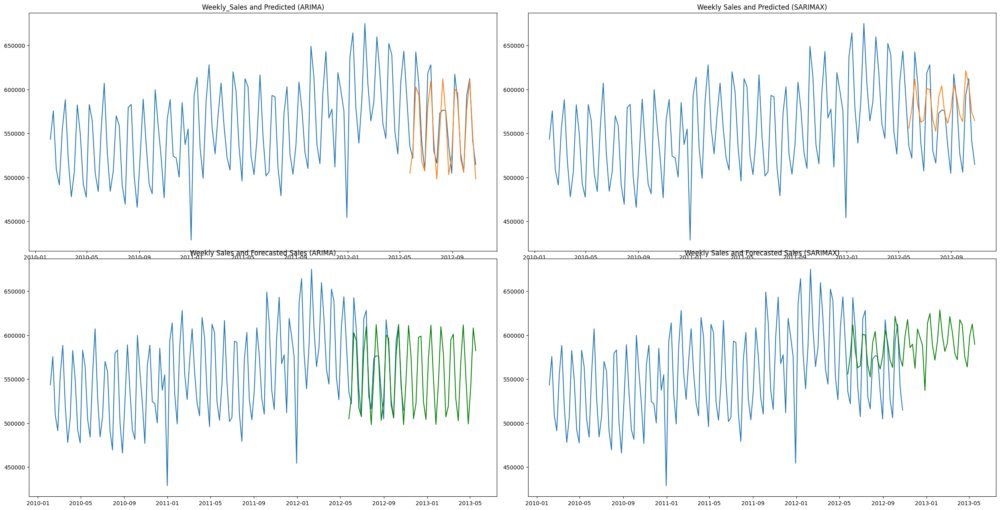

rmse for true values (test) and predicted (ARIMA) for store 43 : 26449.83301540008
rmse for true values (test) and predicted (SARIMAX) for store43 : 13453.183268754574


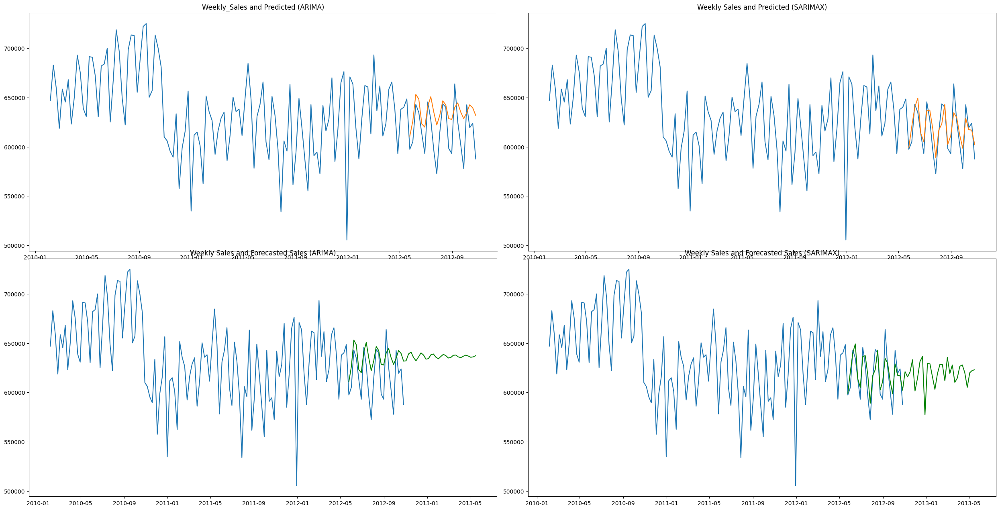

rmse for true values (test) and predicted (ARIMA) for store 44 : 20575.303097117827
rmse for true values (test) and predicted (SARIMAX) for store44 : 13070.858276703406


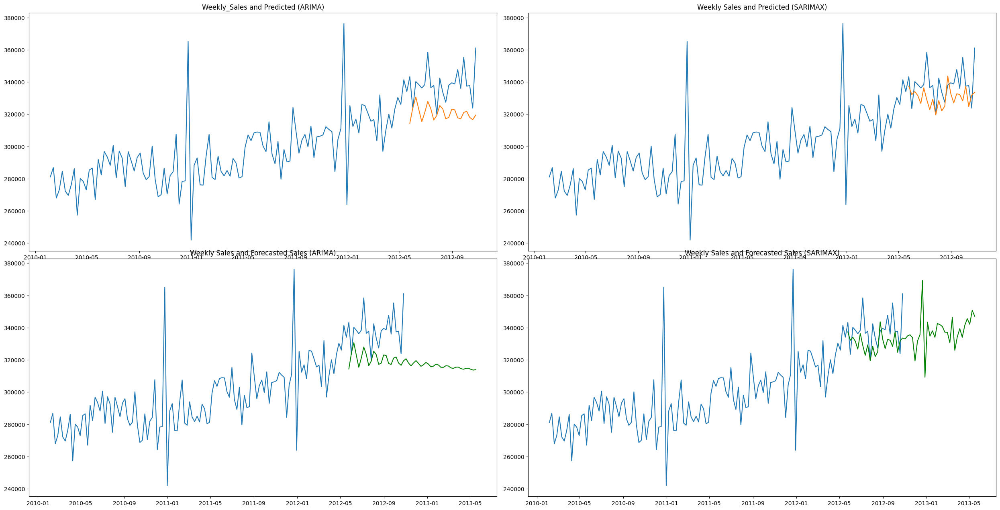

rmse for true values (test) and predicted (ARIMA) for store 45 : 56402.335895219636
rmse for true values (test) and predicted (SARIMAX) for store45 : 40081.81457099529


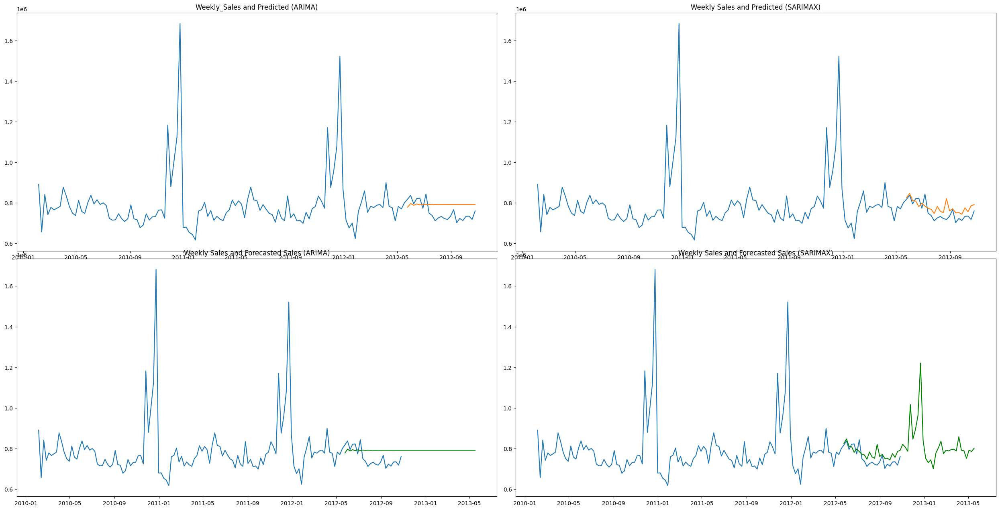

IndexError: ignored

In [ ]:
for i in range(0,45):  # total number of stores

      order_list_A = [(2,0,2), (2,0,1), (2,0,4),(2,0,3),(1,0,4),(1,0,2),(1,0,4),(1,0,2),(1,0,2),(1,0,2),
       (1,0,1),(1,0,2),(1,0,2),(2,0,3),(1,0,2),(1,0,2),(1,0,1),(1,0,2),(1,0,1),(1,0,1),
        (1,0,1),(1,0,2),(1,0,2),(1,0,1),(1,0,2),(1,0,2),(1,0,2),(2,0,1),(1,0,1),(4,0,5),(2,0,1),
         (2,0,2),(3,0,5),(2,0,2),(2,0,4),(2,0,4),(1,0,1),(5,0,4),(1,0,4),(1,0,1),(2,0,3),
          (2,0,3),(3,0,3),(4,0,4),(1,0,2)]
      order_list_S = [(2,0,2,52),(2,0,1,52), (2,0,4,52),(2,0,3,52),(1,0,4,52),(1,0,2,52),(1,0,4,52),(1,0,2,52),(1,0,2,52),(1,0,2,52),
       (1,0,1,52),(1,0,2,52),(1,0,2,52),(2,0,3,52),(1,0,2,52),(1,0,2,52),(1,0,1,52),(1,0,2,52),(1,0,1,52),(1,0,1,52),
        (1,0,1,52),(1,0,2,52),(1,0,2,52),(1,0,1,52),(1,0,2,52),(1,0,2,52),(1,0,2,52),(2,0,1,52),(1,0,1,52),(4,0,5,52),(2,0,1,52),(2,0,2,52),(3,0,5,52),(2,0,2,52),(2,0,4,52),(2,0,4,52),(1,0,1,52),(5,0,4,52),(1,0,4,52),(1,0,1,52),(2,0,3,52),(2,0,3,52),(3,0,3,52),(4,0,4,52),(1,0,2,52)]
      order_arima = order_list_A[i]
      order_sarima = order_list_S[i]
      model_arima = ARIMA(train_df[i], order=order_arima)
      model_arima_fit = model_arima.fit()
      pred_arima = model_arima_fit.predict(start = len(train_df[i]), end = len(train_df[i])+len(test_df[i])-1, dynamic = True)
      rmse_test_pred_arima = np.sqrt(mean_squared_error(test_df[i], pred_arima))
      print(f'rmse for true values (test) and predicted (ARIMA) for store {i+1} : {rmse_test_pred_arima}')
      forecast_arima = model_arima_fit.forecast(steps = 52)


      # Define the SARIMAX (p,d,q,s)
      model_sarimax=SARIMAX(train_df[i],order=order_arima ,seasonal_order=order_sarima)
      model_sarimax_fit=model_sarimax.fit()
      pred_sarimax = model_sarimax_fit.predict(start=len(train_df[i]), end=len(train_df[i])+len(test_df[i])-1,dynamic=True)
      rmse_test_pred_sarimax = np.sqrt(mean_squared_error(test_df[i], pred_sarimax))
      print(f'rmse for true values (test) and predicted (SARIMAX) for store{i+1} : {rmse_test_pred_sarimax}')
      forecast_sarimax = model_sarimax_fit.forecast(steps = 52)


      from matplotlib.gridspec import GridSpec,  GridSpecFromSubplotSpec

      # Create the main figure and the outer subplots
      fig = plt.figure(figsize=(25,25))
      outer_grid = GridSpec(2, 2, figure=fig)

      # First subplot
      inner_grid1 = GridSpecFromSubplotSpec(2, 1, subplot_spec=outer_grid[0])
      ax1 = fig.add_subplot(inner_grid1[0])
      ax1.plot(df_list[i],label = 'Weekly Sales')
      ax1.plot(pred_arima, label = 'Predicted Sales')
      ax1.set_title('Weekly_Sales and Predicted (ARIMA)')

      ax2 = fig.add_subplot(inner_grid1[1])
      ax2.plot(df_list[i], label = 'Weekly Sales')
      ax2.plot(forecast_arima, label = 'Forecasted Sales', color = 'green')
      ax2.set_title('Weekly Sales and Forecasted Sales (ARIMA)')

      # Second subplot
      inner_grid2 = GridSpecFromSubplotSpec(2, 1, subplot_spec=outer_grid[1])
      ax3 = fig.add_subplot(inner_grid2[0])
      ax3.plot(df_list[i], label = 'Weekly Sales')
      ax3.plot(pred_sarimax, label = 'Predicted Sales')
      ax3.set_title('Weekly Sales and Predicted (SARIMAX)')

      ax4 = fig.add_subplot(inner_grid2[1])
      ax4.plot(df_list[i], label = 'Weekly Sales' )
      ax4.plot(forecast_sarimax, label = 'Forecasted Sales' , color = 'green')
      ax4.set_title('Weekly Sales and Forecasted Sales (SARIMAX)')

      # Adjust spacing between subplots
      plt.tight_layout()

      # Display the plot
      plt.show()


# Forecasted Values

In [ ]:
f = []
for i in range(0,45):  # total number of stores


   order_list_A = [(2,0,2), (2,0,1), (2,0,4),(2,0,3),(1,0,4),(1,0,2),(1,0,4),(1,0,2),(1,0,2),(1,0,2),
      (1,0,1),(1,0,2),(1,0,2),(2,0,3),(1,0,2),(1,0,2),(1,0,1),(1,0,2),(1,0,1),(1,0,1),
      (1,0,1),(1,0,2),(1,0,2),(1,0,1),(1,0,2),(1,0,2),(1,0,2),(2,0,1),(1,0,1),(4,0,5),(2,0,1),
        (2,0,2),(3,0,5),(2,0,2),(2,0,4),(2,0,4),(1,0,1),(5,0,4),(1,0,4),(1,0,1),(2,0,3),
        (2,0,3),(3,0,3),(4,0,4),(1,0,2)]
   order_list_S = [(2,0,2,52),(2,0,1,52), (2,0,4,52),(2,0,3,52),(1,0,4,52),(1,0,2,52),(1,0,4,52),(1,0,2,52),(1,0,2,52),(1,0,2,52),
       (1,0,1,52),(1,0,2,52),(1,0,2,52),(2,0,3,52),(1,0,2,52),(1,0,2,52),(1,0,1,52),(1,0,2,52),(1,0,1,52),(1,0,1,52),
        (1,0,1,52),(1,0,2,52),(1,0,2,52),(1,0,1,52),(1,0,2,52),(1,0,2,52),(1,0,2,52),(2,0,1,52),(1,0,1,52),(4,0,5,52),(2,0,1,52),(2,0,2,52),(3,0,5,52),(2,0,2,52),(2,0,4,52),(2,0,4,52),(1,0,1,52),(5,0,4,52),(1,0,4,52),(1,0,1,52),(2,0,3,52),(2,0,3,52),(3,0,3,52),(4,0,4,52),(1,0,2,52)]

   order_arima = order_list_A[i]
   order_sarima = order_list_S[i]

   model_sarimax=SARIMAX(train_df[i],order=order_arima ,seasonal_order=order_sarima)
   model_sarimax_fit=model_sarimax.fit()
   pred_sarimax = model_sarimax_fit.predict(start=len(train_df[i]), end=len(train_df[i])+len(test_df[i])-1,dynamic=True)
   forecast_sarimax = model_sarimax_fit.forecast(steps = 52)
   forecast_sarimax = list(forecast_sarimax)
   f.append(forecast_sarimax)








In [ ]:


forcasted_df = pd.DataFrame({"store 1" : f[0],
              "store 2": f[0],
              "store 3": f[2],
              "store 4": f[3],
              "store 5": f[4],
              "store 6": f[5],
              "store 7": f[6],
              "store 8": f[7],
              "store 9": f[8],
              "store 10": f[9],
              "store 11": f[10],
              "store 12": f[11],
              "store 13": f[12],
              "store 14": f[13],
              "store 15": f[14],
              "store 16": f[15],
              "store 17": f[16],
              "store 18": f[17],
              "store 19": f[18],
              "store 20": f[19],
              "store 21": f[20],
              "store 22": f[21],
              "store 23": f[22],
              "store 24": f[23],
              "store 25": f[24],
              "store 26": f[25],
              "store 27": f[26],
              "store 28": f[27],
              "store 29": f[28],
              "store 30": f[29],
              "store 31": f[30],
              "store 32": f[31],
              "store 33": f[32],
              "store 34": f[33],
              "store 35": f[34],
              "store 36": f[35],
              "store 37": f[36],
              "store 38": f[37],
              "store 39": f[38],
              "store 40": f[39],
              "store 41": f[40],
              "store 42": f[41],
              "store 43": f[42],
              "store 44": f[43],
              "store 45": f[44],
              })

In [ ]:
forecasted_df

,store 1,store 2,store 3,store 4,store 5,store 6,store 7,store 8,store 9,store 10,...,store 36,store 37,store 38,store 39,store 40,store 41,store 42,store 43,store 44,store 45
0,1.569841e+06,1.940040e+06,413732.467768,2.189931e+06,332148.232358,1.568303e+06,484387.919841,9.044674e+05,588609.987259,1.784337e+06,...,315092.648797,520120.053252,413554.756808,1.565515e+06,9.598249e+05,1.351418e+06,556000.066480,599093.300670,337372.285872,8.251579e+05
1,1.673115e+06,1.969722e+06,430622.879598,2.211636e+06,351693.467268,1.667612e+06,526326.165060,9.393757e+05,607502.768566,1.805591e+06,...,317048.147445,516113.767205,456275.765705,1.634935e+06,1.019953e+06,1.344328e+06,577337.971668,620929.064611,332127.768845,8.468259e+05
2,1.644298e+06,1.946871e+06,429114.472713,2.204667e+06,336550.654953,1.597702e+06,563769.045176,9.201034e+05,585323.132685,1.769748e+06,...,321401.717160,520763.980747,453151.348847,1.547728e+06,9.645598e+05,1.349716e+06,611646.604777,640219.914005,334044.188129,8.105837e+05
3,1.608430e+06,1.953087e+06,434543.206838,2.249974e+06,336965.041900,1.608334e+06,562795.657919,9.340963e+05,589961.324436,1.812495e+06,...,327875.651325,528777.757277,417663.661490,1.563084e+06,9.554389e+05,1.338291e+06,582141.772301,649282.243486,331559.713631,8.089225e+05
4,1.551603e+06,1.854877e+06,424538.980063,2.168630e+06,335176.765821,1.557690e+06,576760.392901,8.999626e+05,577895.196594,1.745203e+06,...,315606.374227,520598.363499,407269.383398,1.511039e+06,9.572821e+05,1.311700e+06,563012.877190,613737.412772,326674.710859,7.812452e+05
5,1.581552e+06,1.897482e+06,414583.222477,2.196294e+06,348852.742271,1.646606e+06,610853.063936,9.106933e+05,576581.197326,1.766234e+06,...,313650.868885,524612.341945,443713.623218,1.549180e+06,9.999999e+05,1.362039e+06,565024.419250,605069.382927,336362.538388,7.975878e+05
6,1.610611e+06,1.888912e+06,428996.653794,2.201837e+06,339223.361169,1.650976e+06,640924.028724,8.975082e+05,575466.580472,1.731134e+06,...,321829.604772,510684.220768,464113.696642,1.539529e+06,1.032967e+06,1.364036e+06,601068.418715,636507.919112,328959.872677,7.845071e+05
7,1.559731e+06,1.848935e+06,416323.177455,2.192747e+06,323430.167407,1.536962e+06,565690.798461,8.900354e+05,561493.800765,1.773131e+06,...,324174.906517,515302.462720,431631.254541,1.519272e+06,9.400619e+05,1.312101e+06,600045.970158,637321.039450,322807.126251,7.723749e+05
8,1.523935e+06,1.824481e+06,408767.275025,2.183760e+06,328280.501864,1.534172e+06,588679.092428,8.776945e+05,548556.254702,1.769333e+06,...,316005.619844,518768.021353,412735.975553,1.538799e+06,9.546465e+05,1.337697e+06,566125.028999,618141.460966,329344.856471,7.684089e+05
9,1.496080e+06,1.787648e+06,399772.704317,2.157840e+06,318302.554656,1.504846e+06,564756.846337,8.638875e+05,536472.934853,1.749069e+06,...,313199.649105,518422.858554,420390.684205,1.543998e+06,9.235389e+05,1.312734e+06,552557.202682,589066.627988,319543.418195,7.474173e+05


In [ ]:
# Export the DataFrame to Excel
excel_filename = "forecast.xlsx"
forecasted_df.to_excel(excel_filename, index=False)


# Finished